# Missing values modelling and imputation

##### **Objective**: To select and fine-tune a model for null imputation that would reflect the missingness nature and produce numerically and visually meaningful predictions. The final saved piece of data must be universal and suitable for any kind of further inference or modelling, be comprehensible, readable, intuitive and reflect the reality.

---

## Import libraries and functions

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
import statsmodels.api as sm
from sklearn.experimental import enable_iterative_imputer # imperative to enable IterativeImputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import ExtraTreesRegressor, HistGradientBoostingRegressor, RandomForestRegressor
import gc
from sklearn.model_selection import ParameterGrid
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
import warnings
from sklearn.exceptions import ConvergenceWarning
# Suppress the specific ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from sklearn.ensemble import RandomForestClassifier
import joblib

In [2]:
from utils import (
    get_NA_info, perform_VIF, detect_perfect_multicollinearity_via_rank, get_VIF_features_to_drop, plot_correlations,
    get_a_mask_for_features, test_imputer_scores, plot_scatter_relationship_colored_by_missingness, impute_columns,
    CategoricalImputer, plot_the_features_against_target
)

## Analysis and preparation overview

The workflow needs to be organized in order to avoid:
- redundancy (involving wrong models, excessive assumption check - we only need those for prediction, not interpretability)
- leakage (we can't infer future data - test set - or previously engineered features based on imputed nulls with central tendencies)
- to be able to reuse as much as possible (consistency, readability, time-efficiency)

Since engineering and all the derived features during missing inference were performed on standardized & median-mode-filled data, those features already contain leakage for imputation. We are going to revert back to the first processed data.

## Import pre-processed data

In [3]:
# constants
data_folder_path = "data"
TARGET = "PM2.5"
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

# data import
df_train = pd.read_csv(os.path.join(data_folder_path, 'processed', "01_df_train_preprocessed.csv"), index_col=0)
df_train.index = pd.to_datetime(df_train.index)

df_test = pd.read_csv(os.path.join(data_folder_path, 'processed', "01_df_test_preprocessed.csv"), index_col=0)
df_test.index = pd.to_datetime(df_test.index)

print("df_train:")
display(df_train.head(3))

print("df_test:")
display(df_test.head(3))

df_train:


,year,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,...,wd_binned_NE,wd_binned_NW,wd_binned_S,wd_binned_SE,wd_binned_SW,wd_binned_W,is_working_time,season,is_weekend,PM2.5
datetime,,,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,2,0,4.0
2013-03-01 01:00:00,2013,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,2,0,8.0
2013-03-01 02:00:00,2013,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,2,0,7.0


df_test:


,year,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,...,wd_binned_NE,wd_binned_NW,wd_binned_S,wd_binned_SE,wd_binned_SW,wd_binned_W,is_working_time,season,is_weekend,PM2.5
datetime,,,,,,,,,,,,,,,,,,,,,
2016-05-12 19:00:00,2016,36.0,2.0,18.0,300.0,89.0,20.3,1011.7,-5.6,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,2,0,10.0
2016-05-12 20:00:00,2016,52.0,2.0,30.0,400.0,66.0,17.4,1012.6,0.1,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,2,0,26.0
2016-05-12 21:00:00,2016,77.0,2.0,47.0,500.0,34.0,14.7,1013.8,1.6,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0,2,0,11.0


## Model selection

In [4]:
train_nulls = get_NA_info(df_train, df_train.columns.tolist())
train_nulls

,Feature,NA Count,Total Count,NA Percentage
0,CO,1647,28051,5.871448
1,O3,1516,28051,5.404442
2,NO2,835,28051,2.976721
3,PM2.5,818,28051,2.916117
4,SO2,816,28051,2.908987
5,PM10,632,28051,2.253039
6,wd_deg,11,28051,0.039214
7,TEMP,2,28051,0.007130
8,PRES,2,28051,0.007130
9,DEWP,2,28051,0.007130


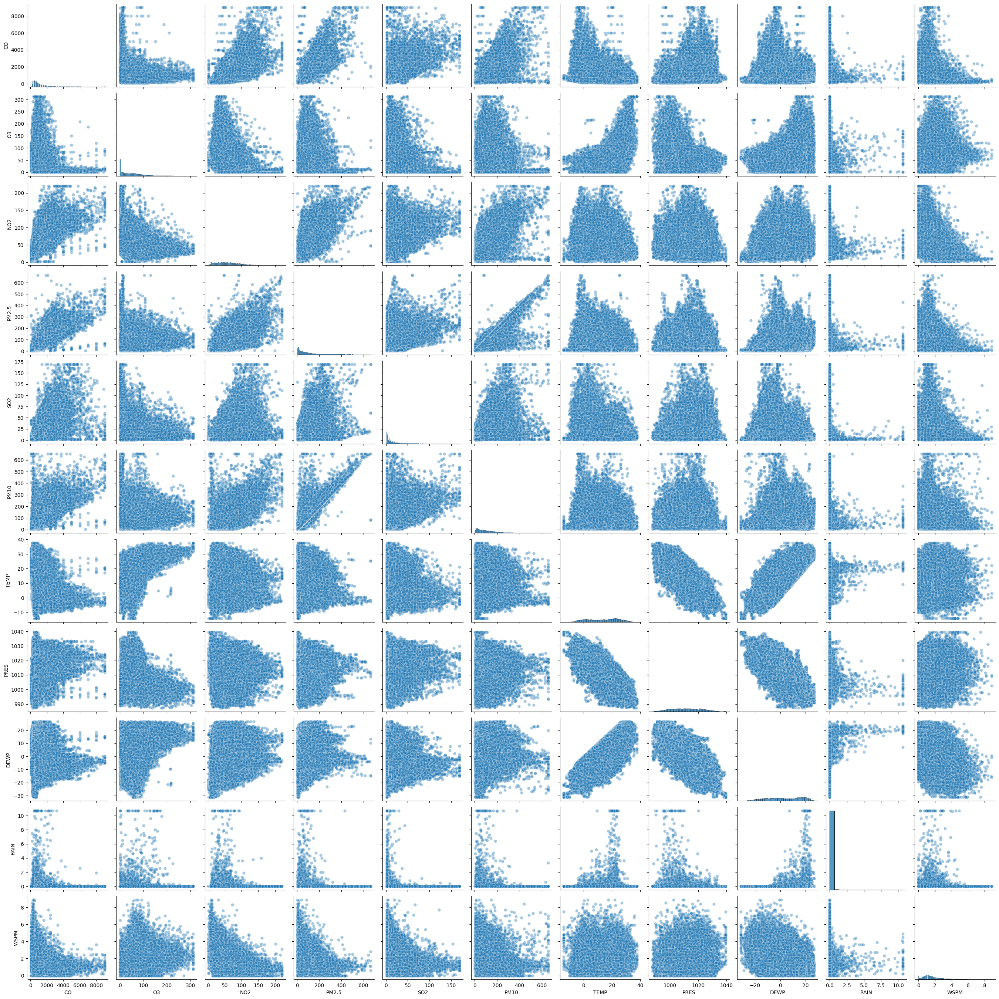

In [5]:
null_num_train_features = [f for f in train_nulls['Feature'].values if f != 'wd_deg'] # remove categorical nulls
sns.pairplot(df_train[null_num_train_features], kind='scatter', plot_kws={'alpha': 0.4})
plt.show()

We are going to use tree-based algorithms without an explicit comparison to linear models. As we see on the pair-plots, the data is non-linear (only `DEWP`-`PRES` pair looks approximately linear, nonetheless still scattered), thus, the effectiveness of linear methods such that would be superior over trees is highly unlikely. Among other reasons why purely tree-based approach is taken is because they:
- give higher accuracy in predictions
- allow to be less strict towards certain assumptions (heteroscedasticity, multicollinearity, outliers etc.)
- don't require data scaling
- are robust to outliers (i.e., diminish and localize their influence)

Therefore, we start from the initially preprocessed data again, eliminating any previous inference engineering and perform lenient yet thorough assumption check to ensure stable and reliable predictions.

## Chosen metrics

For regression, the imputation quality is going to be assessed using `MAE` (to understand general error), `RMSE` (for outlier / big mistakes sensitivity) and `R2` (how well the model understands the data).

For classification (categorical variables), we are using general `accuracy` - percentage of correct predictions and `f1-score` to account for imbalance and assess prediction of all classes.

## Assumption check

### Perfect / high multicollinearity

In [6]:
df_train.columns

Index(['year', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP',
       'RAIN', 'WSPM', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos',
       'day_sin', 'day_cos', 'dayofweek_sin', 'dayofweek_cos', 'wd_deg',
       'wd_binned_N', 'wd_binned_NE', 'wd_binned_NW', 'wd_binned_S',
       'wd_binned_SE', 'wd_binned_SW', 'wd_binned_W', 'is_working_time',
       'season', 'is_weekend', 'PM2.5'],
      dtype='object')

In [7]:
# account for near-perfect multicollinearity in `wd` (it is represented twice; we retain numerical)
df_train = df_train.drop(columns=['wd_binned_N', 'wd_binned_NE', 'wd_binned_NW', 'wd_binned_S', 'wd_binned_SE', 
                                   'wd_binned_SW', 'wd_binned_W'])
df_test = df_test.drop(columns=['wd_binned_N', 'wd_binned_NE', 'wd_binned_NW', 'wd_binned_S', 'wd_binned_SE', 
                                   'wd_binned_SW', 'wd_binned_W'])

In [8]:
detect_perfect_multicollinearity_via_rank(dataframe=df_train, target=TARGET, verbose=True)

Matrix rank: 23 / 23 features


(False, 23)

In [9]:
cat_null_cols = ['wd_deg']
num_null_cols = [col for col in train_nulls.Feature.tolist() if col not in cat_null_cols]

df_train_no_nulls = df_train.copy()
df_train_no_nulls[cat_null_cols] = df_train_no_nulls[cat_null_cols].fillna(df_train_no_nulls[cat_null_cols].mode().iloc[0])
df_train_no_nulls[num_null_cols] = df_train_no_nulls[num_null_cols].fillna(df_train_no_nulls[num_null_cols].median())

vif_table = perform_VIF(data_frame_no_nulls=df_train_no_nulls, 
            encoded_predictors=list(df_train_no_nulls.columns), 
            target=TARGET
            )

vif_table.head(10)

,feature,VIF
7,TEMP,11.749742
9,DEWP,9.143802
15,month_cos,8.215637
14,month_sin,5.814768
13,hour_cos,5.760893
21,is_working_time,5.197857
8,PRES,4.539232
4,NO2,3.389129
22,season,3.120973
5,CO,2.929126


In [10]:
get_VIF_features_to_drop(df_train_no_nulls, TARGET, 5.0)

['before dropping anything: 11.74974234685041',
 'after dropping TEMP: 8.242820934488508',
 'after dropping DEWP: 5.350005854069064',
 'after dropping hour_cos: 4.239591574973818']

The VIF of `11.75` is not a concern for trees in relation to quality of imputations, but still destabilizes the model and adds redundant splits (wastes model's capacity). We would need to deal with `TEMP`-`DEWP` relation problem anyway later on (during the main predictive model + inference), that is why it's time we addressed it now saving the efforts for the regression model ahead. 

We don't care for interpretation of imputation now, but we might care about one in the regression prediction of `PM2.5`, so dropping or residualizing are not the best options (even though we see that dropping `TEMP` and `DEWP` would fix the problem entirely cutting the `VIF` down to `4.24`), so the most suitable version would be feature engineering. 

There is a parameter called **relative humidity** (or specific humidity) - the amount of water vapor in the air compared to the maximum amount it could hold at that specific temperature, expressed as a percentage. Its formula involves both `TEMP` and `DEWP`. We are going to add it and assess how VIF decreases and whether we still need to drop the two.

In [11]:
def relative_humidity(temp_c, dewpoint_c):
    # Magnus formula
    a, b = 17.27, 237.7
    alpha = (a * dewpoint_c) / (b + dewpoint_c)
    beta = (a * temp_c) / (b + temp_c)
    rh = 100 * (np.exp(alpha) / np.exp(beta))
    return rh

In [12]:
df_train['RH'] = relative_humidity(df_train['TEMP'], df_train['DEWP'])

In [13]:
train_nulls = get_NA_info(df_train, df_train.columns.tolist())
cat_null_cols = ['wd_deg']
num_null_cols = [col for col in train_nulls.Feature.tolist() if col not in cat_null_cols]

df_train_no_nulls = df_train.copy()
df_train_no_nulls[cat_null_cols] = df_train_no_nulls[cat_null_cols].fillna(df_train_no_nulls[cat_null_cols].mode().iloc[0])
df_train_no_nulls[num_null_cols] = df_train_no_nulls[num_null_cols].fillna(df_train_no_nulls[num_null_cols].median())

get_VIF_features_to_drop(df_train_no_nulls, TARGET, 5.0)

['before dropping anything: 60.094592184676905',
 'after dropping DEWP: 11.870945740847453',
 'after dropping TEMP: 5.493445101675023',
 'after dropping hour_cos: 4.388937060829824']

Both have to be dropped.

In [14]:
df_test['RH'] = relative_humidity(df_test['TEMP'], df_test['DEWP'])

df_train = df_train.drop(columns=['TEMP', 'DEWP'], axis=1)
df_test = df_test.drop(columns=['TEMP', 'DEWP'], axis=1)

In [15]:
train_nulls = get_NA_info(df_train, df_train.columns.tolist())
cat_null_cols = ['wd_deg']
num_null_cols = [col for col in train_nulls.Feature.tolist() if col not in cat_null_cols]

df_train_no_nulls = df_train.copy()
df_train_no_nulls[cat_null_cols] = df_train_no_nulls[cat_null_cols].fillna(df_train_no_nulls[cat_null_cols].mode().iloc[0])
df_train_no_nulls[num_null_cols] = df_train_no_nulls[num_null_cols].fillna(df_train_no_nulls[num_null_cols].median())

vif_table = perform_VIF(data_frame_no_nulls=df_train_no_nulls, 
            encoded_predictors=list(df_train_no_nulls.columns), 
            target=TARGET
            )

vif_table.head(10)

,feature,VIF
11,hour_cos,5.493445
19,is_working_time,5.189639
13,month_cos,4.390064
12,month_sin,3.955292
7,PRES,3.748860
4,NO2,3.367772
20,season,3.053879
5,CO,3.004968
22,RH,2.857248
21,is_weekend,2.857203


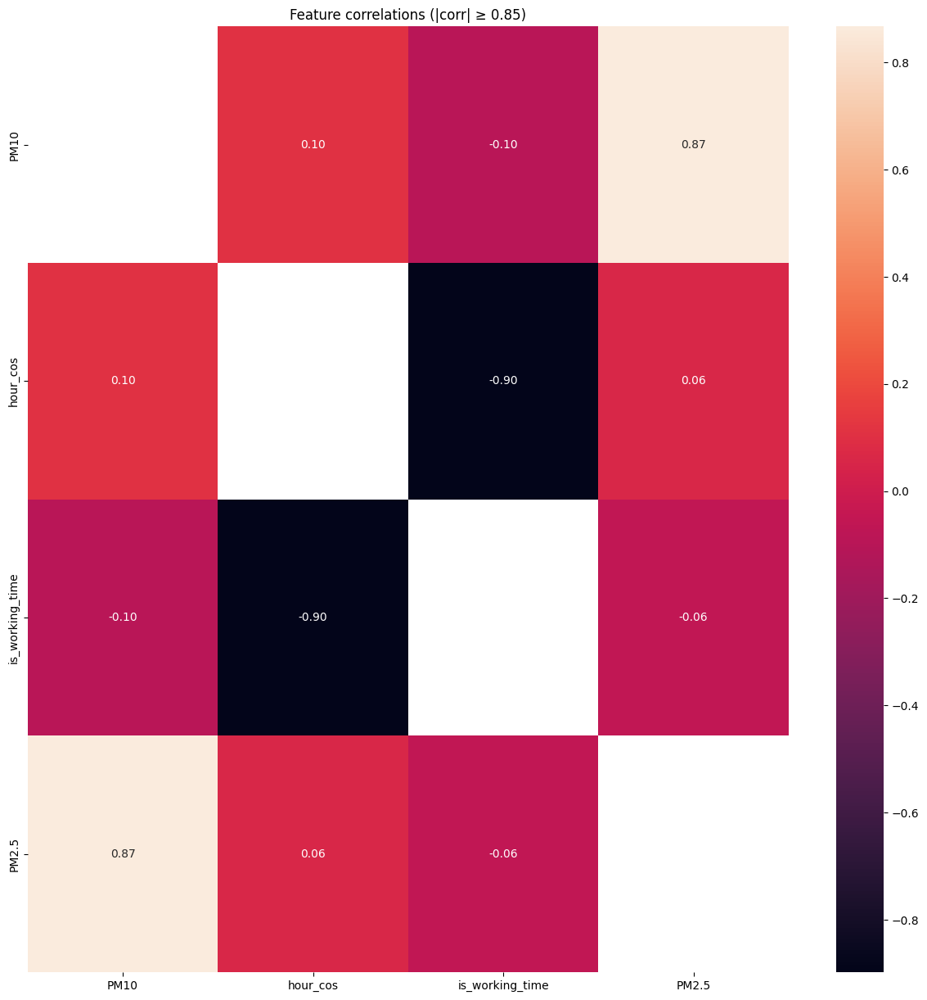

In [16]:
correlations = plot_correlations(df_train, df_train.columns.tolist(), f'Feature correlations', 0.85)

Using the same approach as in missingness interpretation, we are creating `working_hour_component` to account for `is_working_time` vs `hour_cos` multicollinearity (`Pearson`'s = `-0.9`, `VIF` = `5.49` and `5.19` respectively).

In [17]:
df_train['working_hour_component'] = df_train['is_working_time'] * df_train['hour_cos']
df_test['working_hour_component'] = df_test['is_working_time'] * df_test['hour_cos']

df_train = df_train.drop(columns=["is_working_time", "hour_cos"])
df_test = df_test.drop(columns=["is_working_time", "hour_cos"])

In [18]:
train_nulls = get_NA_info(df_train, df_train.columns.tolist())
cat_null_cols = ['wd_deg']
num_null_cols = [col for col in train_nulls.Feature.tolist() if col not in cat_null_cols]

df_train_no_nulls = df_train.copy()
df_train_no_nulls[cat_null_cols] = df_train_no_nulls[cat_null_cols].fillna(df_train_no_nulls[cat_null_cols].mode().iloc[0])
df_train_no_nulls[num_null_cols] = df_train_no_nulls[num_null_cols].fillna(df_train_no_nulls[num_null_cols].median())

vif_table = perform_VIF(data_frame_no_nulls=df_train_no_nulls, 
            encoded_predictors=list(df_train_no_nulls.columns), 
            target=TARGET
            )

vif_table.head(10)

,feature,VIF
12,month_cos,4.391807
11,month_sin,3.969956
7,PRES,3.742756
4,NO2,3.359915
18,season,3.051973
5,CO,3.009765
20,RH,2.885508
19,is_weekend,2.857214
15,dayofweek_sin,2.765368
6,O3,2.542169


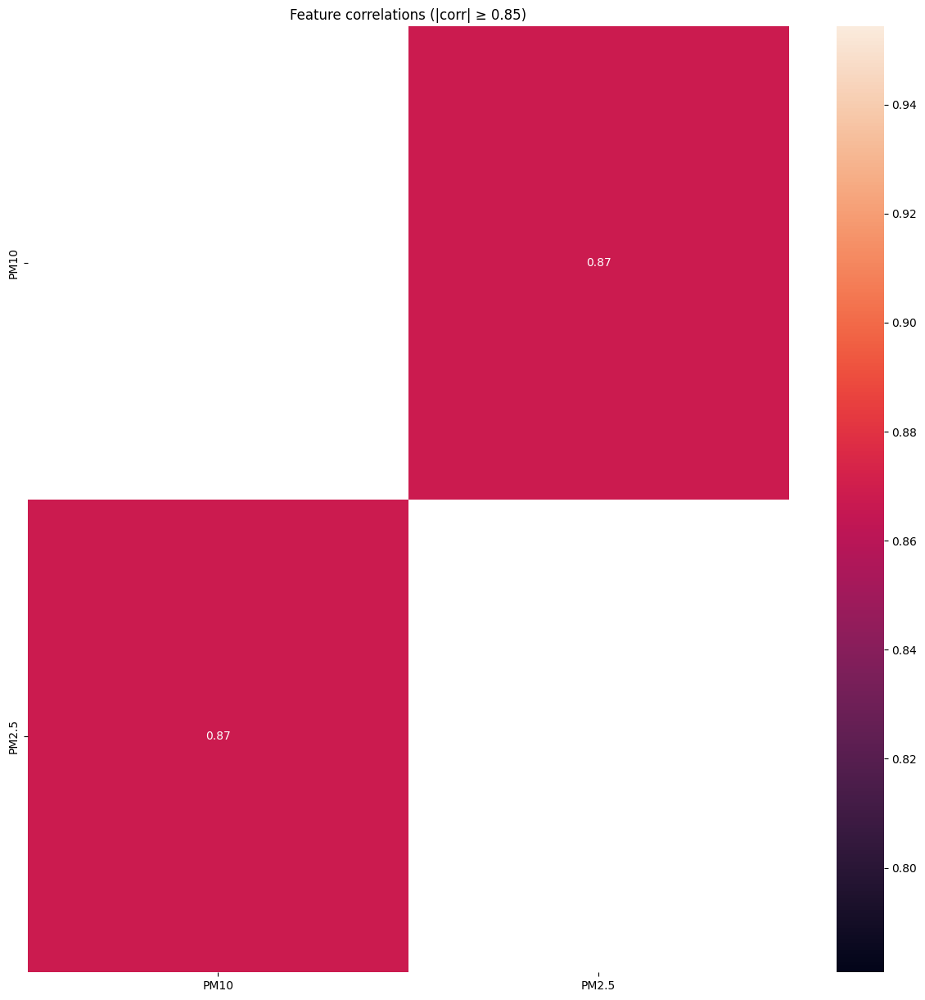

In [19]:
correlations = plot_correlations(df_train, df_train.columns.tolist(), f'Feature correlations', 0.85)

In [20]:
train_nulls = get_NA_info(df_train, df_train.columns.tolist())
train_nulls

,Feature,NA Count,Total Count,NA Percentage
0,CO,1647,28051,5.871448
1,O3,1516,28051,5.404442
2,NO2,835,28051,2.976721
3,PM2.5,818,28051,2.916117
4,SO2,816,28051,2.908987
5,PM10,632,28051,2.253039
6,wd_deg,11,28051,0.039214
7,PRES,2,28051,0.007130
8,RAIN,2,28051,0.007130
9,WSPM,2,28051,0.007130


In [21]:
test_nulls = get_NA_info(df_test, df_test.columns.tolist())
test_nulls

,Feature,NA Count,Total Count,NA Percentage
0,O3,203,7013,2.894624
1,NO2,188,7013,2.680736
2,CO,129,7013,1.839441
3,SO2,119,7013,1.696849
4,PM2.5,107,7013,1.525738
5,PM10,86,7013,1.226294
6,wd_deg,70,7013,0.998146
7,PRES,18,7013,0.256666
8,RAIN,18,7013,0.256666
9,RH,18,7013,0.256666


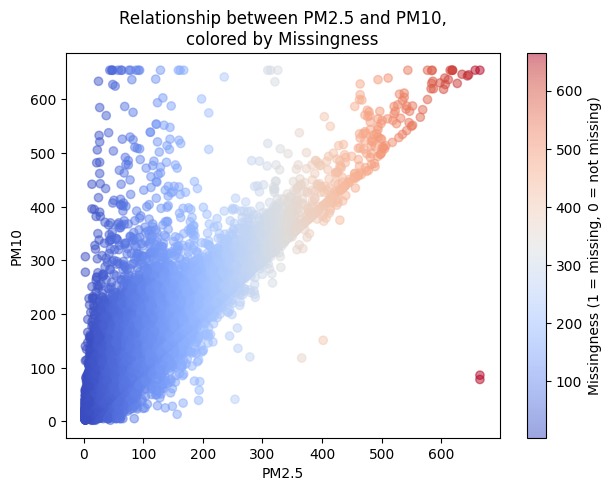

In [22]:
plot_scatter_relationship_colored_by_missingness(df_train, TARGET, 'PM10', df_train[TARGET])

The correlation is strong, but they don't directly form a straight line nor explain each other perfectly. Since they are in direct relationship (the more `PM2.5` in the air, the more `PM10` particles and vice versa), missingness shows up in higher values of both. Based on the previous interpretation model, this pair is too important to alter.

## Imputation strategy & progressive model selection

### Choosing the best model

1. Get artificial 5% masks for each feature that is missing (`get_a_mask_for_features`)
2. Fit the imputer on train to let it memorize the nulls, mask eval data (from step 1), transform eval data and sample non-null indices to evaluate the metrics (`test_imputer_scores`)
3. Use the Monte-Carlo approach and do step 1 and step 2 again a few times with a different random seed in mask (cross-validation imitation).

In [23]:
numerical_nan_cols = ['CO', 'O3', 'NO2', TARGET, 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
ordinal_nan_cols = ['wd_deg']
nominal_nan_groups = {}

In [24]:
jobs = os.cpu_count() - 1 # leave one core for either cross-validation or parallel os processes
#n_nearest_feats = 5

tree_iterative_imputers = {  
    # baseline
    "MedianDummy": SimpleImputer(strategy="median"),  # predicting median always
    
    # --- Bagging ensembles ---
    "ExtraTrees": IterativeImputer(
        estimator=ExtraTreesRegressor(
            n_estimators=50, 
            max_depth=10, 
            n_jobs=jobs, 
            random_state=RANDOM_SEED
        ), 
        max_iter=5, # max times to re-cycle before reaching convergence
        skip_complete=True, # don't re-fit on columns that have no missing values (as we have identical null columns in both train and test)
        #n_nearest_features=n_nearest_feats, # amount of top linearly-correlated predictors to use in training
        random_state=RANDOM_SEED
    ),

    "RandomForest": IterativeImputer(
        estimator=RandomForestRegressor(
            n_estimators=50, 
            max_depth=10, 
            n_jobs=jobs, 
            random_state=RANDOM_SEED
        ), 
        max_iter=5,
        skip_complete=True,
        #n_nearest_features=n_nearest_feats,
        random_state=RANDOM_SEED
    ),

    # --- Boosting algorithms ---
    "HistGB": IterativeImputer(
        estimator=HistGradientBoostingRegressor(
            max_depth=5, 
            max_iter=100, 
            random_state=RANDOM_SEED
        ),
        max_iter=5,
        skip_complete=True,
        #n_nearest_features=n_nearest_feats,
        random_state=RANDOM_SEED
    ),

    "LightGBM": IterativeImputer(
        estimator=lgb.LGBMRegressor(
            n_estimators=100, 
            max_depth=5, 
            n_jobs=jobs, 
            random_state=RANDOM_SEED, 
            verbose=-1
        ),
        max_iter=5, 
        skip_complete=True,
        #n_nearest_features=n_nearest_feats,
        random_state=RANDOM_SEED,
        verbose=0
    ),
}

In [51]:
monte_carlo_seeds = [8, 12, 42]
scores_trees = {name: [] for name in tree_iterative_imputers}

for mt_state in monte_carlo_seeds:
    mask = get_a_mask_for_features(
        data_frame=df_train,
        cont_num_features_to_mask=numerical_nan_cols,
        ord_categorical_features_to_mask=[], # get masks only for numerical
        nominal_groups_to_mask=[], # get masks only for numerical
        rand_seed=mt_state,
        missing_fraction=0.05
    )

    for name, imputer in tree_iterative_imputers.items():
        print("Seed =", mt_state)
        print("Working on", name)

        df_sc = test_imputer_scores(
            imputer=imputer,
            data_frame=df_train,
            numericals_and_ordinals_to_impute=numerical_nan_cols, # only numericals to impute (regression)
            all_dataframe_nominal_groups=nominal_nan_groups, # specify nominals to correctly evaluate
            mask=mask,
            mode='regression',
            verbose=True
        )
        scores_trees[name].append(df_sc)
        display(df_sc)
        del imputer # clean memory

Seed = 8
Working on MedianDummy
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 101.0909, Mean RMSE: 162.6423


,MAE,RMSE,R2,min,max,col_std
CO,766.4752,1292.1684,-0.0947,100.000,9000.000,1176.8241
NO2,28.8129,37.1339,-0.0226,2.000,220.355,36.6493
O3,42.4563,58.4621,-0.0505,0.214,311.466,56.1420
PM10,72.2457,98.7285,-0.0731,2.000,654.582,95.6378
PM2.5,53.9925,76.2239,-0.0615,3.000,665.000,81.5553
PRES,8.7889,10.4408,-0.0028,987.441,1039.400,10.2795
RAIN,0.0474,0.4645,-0.0105,0.000,10.700,0.5066
RH,22.6754,25.8708,-0.0003,4.979,100.000,26.1619
SO2,14.5087,25.6566,-0.1387,0.286,169.000,24.1237
WSPM,0.9056,1.2739,-0.0751,0.000,8.859,1.2348


Seed = 8
Working on ExtraTrees
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 28.7072, Mean RMSE: 45.3530


,MAE,RMSE,R2,min,max,col_std
CO,210.8736,343.4406,0.9227,100.000,9000.000,1176.8241
NO2,10.0204,13.7521,0.8597,2.000,220.355,36.6493
O3,12.9587,19.4196,0.8841,0.214,311.466,56.1420
PM10,22.8736,34.0055,0.8727,2.000,654.582,95.6378
PM2.5,14.1577,20.5620,0.9228,3.000,665.000,81.5553
PRES,2.0594,2.7331,0.9313,987.441,1039.400,10.2795
RAIN,0.0447,0.3310,0.4868,0.000,10.700,0.5066
RH,8.7647,11.0345,0.8180,4.979,100.000,26.1619
SO2,4.7939,7.5550,0.9013,0.286,169.000,24.1237
WSPM,0.5249,0.6971,0.6780,0.000,8.859,1.2348


Seed = 8
Working on RandomForest
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 25.5359, Mean RMSE: 38.3040


,MAE,RMSE,R2,min,max,col_std
CO,187.6579,282.9990,0.9475,100.000,9000.000,1176.8241
NO2,9.1059,12.6525,0.8813,2.000,220.355,36.6493
O3,11.5263,17.8914,0.9016,0.214,311.466,56.1420
PM10,20.7642,31.2687,0.8924,2.000,654.582,95.6378
PM2.5,11.8043,17.5257,0.9439,3.000,665.000,81.5553
PRES,1.8922,2.6051,0.9376,987.441,1039.400,10.2795
RAIN,0.0405,0.3242,0.5076,0.000,10.700,0.5066
RH,7.6167,9.9353,0.8525,4.979,100.000,26.1619
SO2,4.4698,7.2062,0.9102,0.286,169.000,24.1237
WSPM,0.4817,0.6322,0.7353,0.000,8.859,1.2348


Seed = 8
Working on HistGB
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 27.1471, Mean RMSE: 42.6838


,MAE,RMSE,R2,min,max,col_std
CO,202.3633,324.7206,0.9309,100.000,9000.000,1176.8241
NO2,8.9233,12.3032,0.8877,2.000,220.355,36.6493
O3,11.6988,17.7448,0.9032,0.214,311.466,56.1420
PM10,20.9385,32.0891,0.8866,2.000,654.582,95.6378
PM2.5,11.9198,17.8242,0.9420,3.000,665.000,81.5553
PRES,2.7717,3.5151,0.8863,987.441,1039.400,10.2795
RAIN,0.0570,0.3315,0.4854,0.000,10.700,0.5066
RH,7.2088,9.5170,0.8646,4.979,100.000,26.1619
SO2,5.0689,8.0966,0.8866,0.286,169.000,24.1237
WSPM,0.5212,0.6954,0.6796,0.000,8.859,1.2348


Seed = 8
Working on LightGBM
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']


c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: 

Mean MAE: 27.0733, Mean RMSE: 42.4766


,MAE,RMSE,R2,min,max,col_std
CO,201.2144,322.5902,0.9318,100.000,9000.000,1176.8241
NO2,9.0053,12.3480,0.8869,2.000,220.355,36.6493
O3,11.7408,17.5290,0.9056,0.214,311.466,56.1420
PM10,20.7271,31.2343,0.8926,2.000,654.582,95.6378
PM2.5,11.9694,17.8453,0.9418,3.000,665.000,81.5553
PRES,2.8095,3.5801,0.8821,987.441,1039.400,10.2795
RAIN,0.0620,0.3481,0.4325,0.000,10.700,0.5066
RH,7.5909,10.4741,0.8360,4.979,100.000,26.1619
SO2,5.0915,8.1156,0.8861,0.286,169.000,24.1237
WSPM,0.5224,0.7014,0.6741,0.000,8.859,1.2348


Seed = 12
Working on MedianDummy
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 99.9868, Mean RMSE: 159.1519


,MAE,RMSE,R2,min,max,col_std
CO,755.4288,1256.1563,-0.0919,100.000,9000.000,1176.8241
NO2,29.0775,37.8424,-0.0171,2.000,220.355,36.6493
O3,43.1027,59.1503,-0.0805,0.214,311.466,56.1420
PM10,71.2193,97.1443,-0.0693,2.000,654.582,95.6378
PM2.5,53.9460,77.1247,-0.0656,3.000,665.000,81.5553
PRES,8.7700,10.4480,-0.0001,987.441,1039.400,10.2795
RAIN,0.0500,0.4449,-0.0128,0.000,10.700,0.5066
RH,22.4263,25.8466,-0.0000,4.979,100.000,26.1619
SO2,14.9748,26.1222,-0.1516,0.286,169.000,24.1237
WSPM,0.8730,1.2390,-0.0652,0.000,8.859,1.2348


Seed = 12
Working on ExtraTrees
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 28.9078, Mean RMSE: 50.5137


,MAE,RMSE,R2,min,max,col_std
CO,212.5847,390.4396,0.8945,100.000,9000.000,1176.8241
NO2,10.2122,14.1975,0.8568,2.000,220.355,36.6493
O3,13.2369,20.5540,0.8695,0.214,311.466,56.1420
PM10,22.9194,35.5770,0.8566,2.000,654.582,95.6378
PM2.5,14.3722,22.4598,0.9096,3.000,665.000,81.5553
PRES,2.0217,2.7116,0.9326,987.441,1039.400,10.2795
RAIN,0.0413,0.2612,0.6508,0.000,10.700,0.5066
RH,8.4247,10.8539,0.8236,4.979,100.000,26.1619
SO2,4.7807,7.4338,0.9067,0.286,169.000,24.1237
WSPM,0.4838,0.6488,0.7079,0.000,8.859,1.2348


Seed = 12
Working on RandomForest
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 25.9979, Mean RMSE: 43.3757


,MAE,RMSE,R2,min,max,col_std
CO,191.4814,326.5277,0.9262,100.000,9000.000,1176.8241
NO2,9.3895,13.6122,0.8684,2.000,220.355,36.6493
O3,11.7034,18.4965,0.8943,0.214,311.466,56.1420
PM10,20.9218,33.4144,0.8735,2.000,654.582,95.6378
PM2.5,12.2989,20.9849,0.9211,3.000,665.000,81.5553
PRES,1.8514,2.5867,0.9387,987.441,1039.400,10.2795
RAIN,0.0366,0.2298,0.7298,0.000,10.700,0.5066
RH,7.3806,9.9412,0.8521,4.979,100.000,26.1619
SO2,4.4607,7.3570,0.9087,0.286,169.000,24.1237
WSPM,0.4547,0.6071,0.7443,0.000,8.859,1.2348


Seed = 12
Working on HistGB
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 28.0162, Mean RMSE: 47.0355


,MAE,RMSE,R2,min,max,col_std
CO,209.2505,359.7631,0.9104,100.000,9000.000,1176.8241
NO2,9.0372,12.7701,0.8842,2.000,220.355,36.6493
O3,12.2555,19.1636,0.8866,0.214,311.466,56.1420
PM10,21.5593,36.1198,0.8522,2.000,654.582,95.6378
PM2.5,12.3601,20.0311,0.9281,3.000,665.000,81.5553
PRES,2.7772,3.5451,0.8849,987.441,1039.400,10.2795
RAIN,0.0534,0.3083,0.5134,0.000,10.700,0.5066
RH,7.2333,9.7279,0.8583,4.979,100.000,26.1619
SO2,5.1424,8.2498,0.8851,0.286,169.000,24.1237
WSPM,0.4929,0.6764,0.6825,0.000,8.859,1.2348


Seed = 12
Working on LightGBM
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']


c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: 

Mean MAE: 28.0325, Mean RMSE: 48.4609


,MAE,RMSE,R2,min,max,col_std
CO,208.7337,372.3281,0.9041,100.000,9000.000,1176.8241
NO2,9.0151,12.6987,0.8855,2.000,220.355,36.6493
O3,12.2579,19.0408,0.8880,0.214,311.466,56.1420
PM10,21.2045,34.8948,0.8620,2.000,654.582,95.6378
PM2.5,12.6753,21.2030,0.9195,3.000,665.000,81.5553
PRES,2.8069,3.5949,0.8816,987.441,1039.400,10.2795
RAIN,0.0655,0.3302,0.4420,0.000,10.700,0.5066
RH,7.9495,11.7254,0.7942,4.979,100.000,26.1619
SO2,5.1200,8.1163,0.8888,0.286,169.000,24.1237
WSPM,0.4961,0.6769,0.6821,0.000,8.859,1.2348


Seed = 42
Working on MedianDummy
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 95.5937, Mean RMSE: 148.6587


,MAE,RMSE,R2,min,max,col_std
CO,703.8450,1135.0814,-0.0772,100.000,9000.000,1176.8241
NO2,28.3095,36.8698,-0.0296,2.000,220.355,36.6493
O3,43.9240,60.8662,-0.0661,0.214,311.466,56.1420
PM10,74.1317,102.2355,-0.0632,2.000,654.582,95.6378
PM2.5,56.8504,84.4956,-0.0844,3.000,665.000,81.5553
PRES,8.6612,10.3147,-0.0002,987.441,1039.400,10.2795
RAIN,0.0303,0.2836,-0.0116,0.000,10.700,0.5066
RH,22.8565,26.2930,-0.0000,4.979,100.000,26.1619
SO2,16.4683,28.9229,-0.1699,0.286,169.000,24.1237
WSPM,0.8602,1.2248,-0.0444,0.000,8.859,1.2348


Seed = 42
Working on ExtraTrees
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 27.7044, Mean RMSE: 41.7452


,MAE,RMSE,R2,min,max,col_std
CO,200.9753,305.1549,0.9221,100.000,9000.000,1176.8241
NO2,9.9879,13.5019,0.8619,2.000,220.355,36.6493
O3,12.9021,19.6023,0.8894,0.214,311.466,56.1420
PM10,22.7645,35.5936,0.8711,2.000,654.582,95.6378
PM2.5,14.4417,21.3904,0.9305,3.000,665.000,81.5553
PRES,1.9936,2.6220,0.9354,987.441,1039.400,10.2795
RAIN,0.0335,0.1783,0.6000,0.000,10.700,0.5066
RH,8.4771,10.7384,0.8332,4.979,100.000,26.1619
SO2,4.9598,7.9884,0.9108,0.286,169.000,24.1237
WSPM,0.5089,0.6813,0.6769,0.000,8.859,1.2348


Seed = 42
Working on RandomForest
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 25.5270, Mean RMSE: 37.7500


,MAE,RMSE,R2,min,max,col_std
CO,186.7969,272.6629,0.9378,100.000,9000.000,1176.8241
NO2,9.1712,12.3879,0.8838,2.000,220.355,36.6493
O3,11.3842,17.4200,0.9127,0.214,311.466,56.1420
PM10,21.0234,35.0313,0.8752,2.000,654.582,95.6378
PM2.5,12.3931,19.2647,0.9436,3.000,665.000,81.5553
PRES,1.8176,2.5188,0.9404,987.441,1039.400,10.2795
RAIN,0.0335,0.1706,0.6338,0.000,10.700,0.5066
RH,7.4848,9.7940,0.8612,4.979,100.000,26.1619
SO2,4.6920,7.6273,0.9186,0.286,169.000,24.1237
WSPM,0.4730,0.6228,0.7300,0.000,8.859,1.2348


Seed = 42
Working on HistGB
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 26.3743, Mean RMSE: 39.9304


,MAE,RMSE,R2,min,max,col_std
CO,193.3400,291.6909,0.9289,100.000,9000.000,1176.8241
NO2,8.9370,12.1121,0.8889,2.000,220.355,36.6493
O3,11.9721,17.6267,0.9106,0.214,311.466,56.1420
PM10,21.0704,36.0831,0.8676,2.000,654.582,95.6378
PM2.5,12.5233,18.8705,0.9459,3.000,665.000,81.5553
PRES,2.6788,3.4214,0.8899,987.441,1039.400,10.2795
RAIN,0.0494,0.2215,0.3826,0.000,10.700,0.5066
RH,7.1888,9.5277,0.8687,4.979,100.000,26.1619
SO2,5.4745,9.0637,0.8851,0.286,169.000,24.1237
WSPM,0.5086,0.6863,0.6721,0.000,8.859,1.2348


Seed = 42
Working on LightGBM
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']


c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yur4ik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:2749: 

Mean MAE: 26.6101, Mean RMSE: 40.5041


,MAE,RMSE,R2,min,max,col_std
CO,195.1244,296.3645,0.9266,100.000,9000.000,1176.8241
NO2,8.8660,12.1117,0.8889,2.000,220.355,36.6493
O3,12.0420,17.7411,0.9094,0.214,311.466,56.1420
PM10,21.1753,35.6089,0.8710,2.000,654.582,95.6378
PM2.5,12.6074,19.1044,0.9446,3.000,665.000,81.5553
PRES,2.6934,3.4278,0.8895,987.441,1039.400,10.2795
RAIN,0.0528,0.2399,0.2759,0.000,10.700,0.5066
RH,7.6491,10.7628,0.8324,4.979,100.000,26.1619
SO2,5.3820,8.9915,0.8869,0.286,169.000,24.1237
WSPM,0.5090,0.6882,0.6703,0.000,8.859,1.2348


In [52]:
# Compute median results
median_stratified_dfs = {}
for model in tree_iterative_imputers:
    all_runs_per_model = pd.concat(scores_trees[model]) # concat all different-seed dfs for current model
    median_stratified_dfs[model] = all_runs_per_model.groupby(all_runs_per_model.index).median() # group by index (feature)
    print(model)
    display(median_stratified_dfs[model])

MedianDummy


,MAE,RMSE,R2,min,max,col_std
CO,755.4288,1256.1563,-0.0919,100.000,9000.000,1176.8241
NO2,28.8129,37.1339,-0.0226,2.000,220.355,36.6493
O3,43.1027,59.1503,-0.0661,0.214,311.466,56.1420
PM10,72.2457,98.7285,-0.0693,2.000,654.582,95.6378
PM2.5,53.9925,77.1247,-0.0656,3.000,665.000,81.5553
PRES,8.7700,10.4408,-0.0002,987.441,1039.400,10.2795
RAIN,0.0474,0.4449,-0.0116,0.000,10.700,0.5066
RH,22.6754,25.8708,-0.0000,4.979,100.000,26.1619
SO2,14.9748,26.1222,-0.1516,0.286,169.000,24.1237
WSPM,0.8730,1.2390,-0.0652,0.000,8.859,1.2348


ExtraTrees


,MAE,RMSE,R2,min,max,col_std
CO,210.8736,343.4406,0.9221,100.000,9000.000,1176.8241
NO2,10.0204,13.7521,0.8597,2.000,220.355,36.6493
O3,12.9587,19.6023,0.8841,0.214,311.466,56.1420
PM10,22.8736,35.5770,0.8711,2.000,654.582,95.6378
PM2.5,14.3722,21.3904,0.9228,3.000,665.000,81.5553
PRES,2.0217,2.7116,0.9326,987.441,1039.400,10.2795
RAIN,0.0413,0.2612,0.6000,0.000,10.700,0.5066
RH,8.4771,10.8539,0.8236,4.979,100.000,26.1619
SO2,4.7939,7.5550,0.9067,0.286,169.000,24.1237
WSPM,0.5089,0.6813,0.6780,0.000,8.859,1.2348


RandomForest


,MAE,RMSE,R2,min,max,col_std
CO,187.6579,282.9990,0.9378,100.000,9000.000,1176.8241
NO2,9.1712,12.6525,0.8813,2.000,220.355,36.6493
O3,11.5263,17.8914,0.9016,0.214,311.466,56.1420
PM10,20.9218,33.4144,0.8752,2.000,654.582,95.6378
PM2.5,12.2989,19.2647,0.9436,3.000,665.000,81.5553
PRES,1.8514,2.5867,0.9387,987.441,1039.400,10.2795
RAIN,0.0366,0.2298,0.6338,0.000,10.700,0.5066
RH,7.4848,9.9353,0.8525,4.979,100.000,26.1619
SO2,4.4698,7.3570,0.9102,0.286,169.000,24.1237
WSPM,0.4730,0.6228,0.7353,0.000,8.859,1.2348


HistGB


,MAE,RMSE,R2,min,max,col_std
CO,202.3633,324.7206,0.9289,100.000,9000.000,1176.8241
NO2,8.9370,12.3032,0.8877,2.000,220.355,36.6493
O3,11.9721,17.7448,0.9032,0.214,311.466,56.1420
PM10,21.0704,36.0831,0.8676,2.000,654.582,95.6378
PM2.5,12.3601,18.8705,0.9420,3.000,665.000,81.5553
PRES,2.7717,3.5151,0.8863,987.441,1039.400,10.2795
RAIN,0.0534,0.3083,0.4854,0.000,10.700,0.5066
RH,7.2088,9.5277,0.8646,4.979,100.000,26.1619
SO2,5.1424,8.2498,0.8851,0.286,169.000,24.1237
WSPM,0.5086,0.6863,0.6796,0.000,8.859,1.2348


LightGBM


,MAE,RMSE,R2,min,max,col_std
CO,201.2144,322.5902,0.9266,100.000,9000.000,1176.8241
NO2,9.0053,12.3480,0.8869,2.000,220.355,36.6493
O3,12.0420,17.7411,0.9056,0.214,311.466,56.1420
PM10,21.1753,34.8948,0.8710,2.000,654.582,95.6378
PM2.5,12.6074,19.1044,0.9418,3.000,665.000,81.5553
PRES,2.8069,3.5801,0.8821,987.441,1039.400,10.2795
RAIN,0.0620,0.3302,0.4325,0.000,10.700,0.5066
RH,7.6491,10.7628,0.8324,4.979,100.000,26.1619
SO2,5.1200,8.1163,0.8869,0.286,169.000,24.1237
WSPM,0.5090,0.6882,0.6741,0.000,8.859,1.2348


`RandomForest` outperforms others. Whether we need to tune it depends on the variance between the runs. To consider this time-quality trade-off, we arbitrary launch a few sets parameters and if the difference is significant, the tuning should take place.

### Tuning

In [53]:
param_grid = {
    "n_estimators": [40, 80],
    "max_iter": [10, 15],
    "max_depth": [8, 15]
}

best_params = []
best_mean_mae = np.inf
best_results = pd.DataFrame()

mask = get_a_mask_for_features(data_frame=df_train,
                                cont_num_features_to_mask=numerical_nan_cols,
                                ord_categorical_features_to_mask=[],
                                nominal_groups_to_mask=[],
                                rand_seed=RANDOM_SEED,
                                missing_fraction=0.05)

for params in ParameterGrid(param_grid):
    key = f"n_estim{params['n_estimators']}_iter{params['max_iter']}_depth{params['max_depth']}"
    print("Working on", key)

    et_estimator=RandomForestRegressor(
        n_estimators=params['n_estimators'], 
        max_depth=params['max_depth'], 
        n_jobs=jobs, 
        bootstrap=True, 
        random_state=RANDOM_SEED
    ) 
    
    et_imputer = IterativeImputer(
        estimator=et_estimator,
        max_iter=params['max_iter'],
        skip_complete=True, 
        random_state=RANDOM_SEED,
    )

    scores_df = test_imputer_scores(
        imputer=et_imputer,
        data_frame=df_train,
        numericals_and_ordinals_to_impute=numerical_nan_cols, # only numericals to impute (regression)
        all_dataframe_nominal_groups=nominal_nan_groups, # specify nominals to correctly evaluate
        mask=mask,
        mode='regression',
        verbose=True
    )

    curr_mean_mae = scores_df[scores_df['MAE'] != "-"]['MAE'].mean()

    if curr_mean_mae < best_mean_mae:
        print(f"🟢 New best: {curr_mean_mae}")
        best_mean_mae = curr_mean_mae
        best_params = key
        best_results = scores_df

    display(scores_df)
    del et_estimator, et_imputer

Working on n_estim40_iter10_depth8
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 31.9011, Mean RMSE: 47.8983
🟢 New best: 31.90106


,MAE,RMSE,R2,min,max,col_std
CO,235.2396,352.6743,0.8960,100.000,9000.000,1176.8241
NO2,11.1550,15.0017,0.8296,2.000,220.355,36.6493
O3,14.7542,22.5561,0.8536,0.214,311.466,56.1420
PM10,24.2407,39.4523,0.8417,2.000,654.582,95.6378
PM2.5,15.2528,23.1982,0.9183,3.000,665.000,81.5553
PRES,2.5731,3.4012,0.8912,987.441,1039.400,10.2795
RAIN,0.0392,0.2010,0.4916,0.000,10.700,0.5066
RH,9.0800,11.7050,0.8018,4.979,100.000,26.1619
SO2,6.1430,10.0835,0.8578,0.286,169.000,24.1237
WSPM,0.5330,0.7101,0.6489,0.000,8.859,1.2348


Working on n_estim80_iter10_depth8
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 31.8558, Mean RMSE: 47.8769
🟢 New best: 31.855799999999995


,MAE,RMSE,R2,min,max,col_std
CO,234.8353,352.4032,0.8962,100.000,9000.000,1176.8241
NO2,11.1976,15.0426,0.8286,2.000,220.355,36.6493
O3,14.6900,22.3837,0.8558,0.214,311.466,56.1420
PM10,24.2733,39.6043,0.8404,2.000,654.582,95.6378
PM2.5,15.2261,23.3612,0.9171,3.000,665.000,81.5553
PRES,2.5667,3.3897,0.8920,987.441,1039.400,10.2795
RAIN,0.0396,0.2046,0.4735,0.000,10.700,0.5066
RH,9.1077,11.7215,0.8013,4.979,100.000,26.1619
SO2,6.0906,9.9495,0.8616,0.286,169.000,24.1237
WSPM,0.5311,0.7085,0.6505,0.000,8.859,1.2348


Working on n_estim40_iter15_depth8
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 31.9041, Mean RMSE: 47.8866


,MAE,RMSE,R2,min,max,col_std
CO,235.2495,352.6153,0.8960,100.000,9000.000,1176.8241
NO2,11.1678,15.0170,0.8292,2.000,220.355,36.6493
O3,14.7593,22.5561,0.8536,0.214,311.466,56.1420
PM10,24.2235,39.3753,0.8423,2.000,654.582,95.6378
PM2.5,15.2608,23.1976,0.9183,3.000,665.000,81.5553
PRES,2.5738,3.4004,0.8913,987.441,1039.400,10.2795
RAIN,0.0392,0.1998,0.4977,0.000,10.700,0.5066
RH,9.0920,11.7024,0.8019,4.979,100.000,26.1619
SO2,6.1415,10.0919,0.8576,0.286,169.000,24.1237
WSPM,0.5334,0.7105,0.6485,0.000,8.859,1.2348


Working on n_estim80_iter15_depth8
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 31.8535, Mean RMSE: 47.8623
🟢 New best: 31.853500000000004


,MAE,RMSE,R2,min,max,col_std
CO,234.8410,352.4272,0.8962,100.000,9000.000,1176.8241
NO2,11.1926,15.0426,0.8286,2.000,220.355,36.6493
O3,14.6827,22.3978,0.8556,0.214,311.466,56.1420
PM10,24.2612,39.4419,0.8418,2.000,654.582,95.6378
PM2.5,15.2192,23.3402,0.9173,3.000,665.000,81.5553
PRES,2.5661,3.3908,0.8919,987.441,1039.400,10.2795
RAIN,0.0395,0.2049,0.4719,0.000,10.700,0.5066
RH,9.1104,11.7221,0.8012,4.979,100.000,26.1619
SO2,6.0909,9.9459,0.8617,0.286,169.000,24.1237
WSPM,0.5314,0.7091,0.6499,0.000,8.859,1.2348


Working on n_estim40_iter10_depth15
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 14.1915, Mean RMSE: 22.9611
🟢 New best: 14.191489999999998


,MAE,RMSE,R2,min,max,col_std
CO,103.6902,163.6427,0.9776,100.000,9000.000,1176.8241
NO2,5.0213,7.4266,0.9582,2.000,220.355,36.6493
O3,5.7376,9.5395,0.9738,0.214,311.466,56.1420
PM10,12.8084,24.1479,0.9407,2.000,654.582,95.6378
PM2.5,7.2540,13.5621,0.9721,3.000,665.000,81.5553
PRES,0.7118,1.0931,0.9888,987.441,1039.400,10.2795
RAIN,0.0230,0.1274,0.7958,0.000,10.700,0.5066
RH,3.9322,5.4299,0.9574,4.979,100.000,26.1619
SO2,2.4317,4.2411,0.9748,0.286,169.000,24.1237
WSPM,0.3047,0.4002,0.8885,0.000,8.859,1.2348


Working on n_estim80_iter10_depth15
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 13.8296, Mean RMSE: 22.3862
🟢 New best: 13.82959


,MAE,RMSE,R2,min,max,col_std
CO,101.0714,160.9585,0.9783,100.000,9000.000,1176.8241
NO2,5.0155,7.3559,0.9590,2.000,220.355,36.6493
O3,5.5394,9.2141,0.9756,0.214,311.466,56.1420
PM10,12.4085,22.2408,0.9497,2.000,654.582,95.6378
PM2.5,6.9963,13.0370,0.9742,3.000,665.000,81.5553
PRES,0.6953,1.0551,0.9895,987.441,1039.400,10.2795
RAIN,0.0238,0.1305,0.7857,0.000,10.700,0.5066
RH,3.8566,5.2635,0.9599,4.979,100.000,26.1619
SO2,2.3855,4.2084,0.9752,0.286,169.000,24.1237
WSPM,0.3036,0.3983,0.8895,0.000,8.859,1.2348


Working on n_estim40_iter15_depth15
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 14.1089, Mean RMSE: 22.8227


,MAE,RMSE,R2,min,max,col_std
CO,102.9590,163.7178,0.9776,100.000,9000.000,1176.8241
NO2,5.0446,7.4430,0.9580,2.000,220.355,36.6493
O3,5.7525,9.5470,0.9738,0.214,311.466,56.1420
PM10,12.6587,22.4557,0.9487,2.000,654.582,95.6378
PM2.5,7.2756,13.8137,0.9710,3.000,665.000,81.5553
PRES,0.7026,1.0779,0.9891,987.441,1039.400,10.2795
RAIN,0.0228,0.1271,0.7968,0.000,10.700,0.5066
RH,3.9304,5.3780,0.9582,4.979,100.000,26.1619
SO2,2.4366,4.2667,0.9745,0.286,169.000,24.1237
WSPM,0.3062,0.4004,0.8884,0.000,8.859,1.2348


Working on n_estim80_iter15_depth15
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 13.8538, Mean RMSE: 22.2761


,MAE,RMSE,R2,min,max,col_std
CO,101.3247,160.2641,0.9785,100.000,9000.000,1176.8241
NO2,4.9847,7.3533,0.9590,2.000,220.355,36.6493
O3,5.5412,9.1965,0.9757,0.214,311.466,56.1420
PM10,12.3631,21.8576,0.9514,2.000,654.582,95.6378
PM2.5,7.0487,13.0370,0.9742,3.000,665.000,81.5553
PRES,0.6980,1.0554,0.9895,987.441,1039.400,10.2795
RAIN,0.0242,0.1287,0.7917,0.000,10.700,0.5066
RH,3.8939,5.3376,0.9588,4.979,100.000,26.1619
SO2,2.3558,4.1339,0.9761,0.286,169.000,24.1237
WSPM,0.3037,0.3972,0.8901,0.000,8.859,1.2348


Taking into account that two of the selected parameters were best at their maximum, we may still extend the range.

In [56]:
param_grid = {
    "n_estimators": [120, 150],
    "max_iter": [8, 10],
    "max_depth": [15, 17]
}

best_params = []
best_mean_mae = 13.82959
best_results = pd.DataFrame()

mask = get_a_mask_for_features(data_frame=df_train,
                                cont_num_features_to_mask=numerical_nan_cols,
                                ord_categorical_features_to_mask=[],
                                nominal_groups_to_mask=[],
                                rand_seed=RANDOM_SEED,
                                missing_fraction=0.05)

for params in ParameterGrid(param_grid):
    key = f"n_estim{params['n_estimators']}_iter{params['max_iter']}_depth{params['max_depth']}"
    print("Working on", key)

    et_estimator=RandomForestRegressor(
        n_estimators=params['n_estimators'], 
        max_depth=params['max_depth'], 
        n_jobs=jobs, 
        bootstrap=True, 
        random_state=RANDOM_SEED
    ) 
    
    et_imputer = IterativeImputer(
        estimator=et_estimator,
        max_iter=params['max_iter'],
        skip_complete=True, 
        random_state=RANDOM_SEED,
    )

    scores_df = test_imputer_scores(
        imputer=et_imputer,
        data_frame=df_train,
        numericals_and_ordinals_to_impute=numerical_nan_cols, # only numericals to impute (regression)
        all_dataframe_nominal_groups=nominal_nan_groups, # specify nominals to correctly evaluate
        mask=mask,
        mode='regression',
        verbose=True
    )

    curr_mean_mae = scores_df[scores_df['MAE'] != "-"]['MAE'].mean()

    if curr_mean_mae < best_mean_mae:
        print(f"🟢 New best: {curr_mean_mae}")
        best_mean_mae = curr_mean_mae
        best_params = key
        best_results = scores_df

    display(scores_df)
    del et_estimator, et_imputer

Working on n_estim120_iter8_depth15
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 13.7201, Mean RMSE: 22.0316
🟢 New best: 13.720110000000002


,MAE,RMSE,R2,min,max,col_std
CO,99.4942,154.7659,0.9800,100.000,9000.000,1176.8241
NO2,4.9961,7.3085,0.9595,2.000,220.355,36.6493
O3,5.5320,9.1670,0.9758,0.214,311.466,56.1420
PM10,12.7555,24.5055,0.9389,2.000,654.582,95.6378
PM2.5,7.1108,13.3694,0.9729,3.000,665.000,81.5553
PRES,0.7130,1.0882,0.9889,987.441,1039.400,10.2795
RAIN,0.0238,0.1324,0.7794,0.000,10.700,0.5066
RH,3.8625,5.2995,0.9594,4.979,100.000,26.1619
SO2,2.4107,4.2827,0.9743,0.286,169.000,24.1237
WSPM,0.3025,0.3969,0.8903,0.000,8.859,1.2348


Working on n_estim150_iter8_depth15
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 13.6268, Mean RMSE: 21.9645
🟢 New best: 13.626749999999998


,MAE,RMSE,R2,min,max,col_std
CO,98.8724,154.5343,0.9800,100.000,9000.000,1176.8241
NO2,4.9840,7.2576,0.9601,2.000,220.355,36.6493
O3,5.4639,9.0277,0.9765,0.214,311.466,56.1420
PM10,12.6541,24.5591,0.9386,2.000,654.582,95.6378
PM2.5,7.0325,13.1396,0.9738,3.000,665.000,81.5553
PRES,0.7066,1.0856,0.9889,987.441,1039.400,10.2795
RAIN,0.0242,0.1347,0.7719,0.000,10.700,0.5066
RH,3.8622,5.3070,0.9593,4.979,100.000,26.1619
SO2,2.3653,4.1995,0.9753,0.286,169.000,24.1237
WSPM,0.3023,0.3997,0.8888,0.000,8.859,1.2348


Working on n_estim120_iter10_depth15
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 13.6631, Mean RMSE: 21.9222


,MAE,RMSE,R2,min,max,col_std
CO,99.1227,153.8955,0.9802,100.000,9000.000,1176.8241
NO2,4.9970,7.3156,0.9595,2.000,220.355,36.6493
O3,5.5333,9.1255,0.9760,0.214,311.466,56.1420
PM10,12.6427,24.5370,0.9388,2.000,654.582,95.6378
PM2.5,7.0623,13.2744,0.9732,3.000,665.000,81.5553
PRES,0.7098,1.0852,0.9889,987.441,1039.400,10.2795
RAIN,0.0240,0.1358,0.7679,0.000,10.700,0.5066
RH,3.8693,5.2809,0.9597,4.979,100.000,26.1619
SO2,2.3683,4.1776,0.9756,0.286,169.000,24.1237
WSPM,0.3016,0.3948,0.8915,0.000,8.859,1.2348


Working on n_estim150_iter10_depth15
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 13.6063, Mean RMSE: 21.9091
🟢 New best: 13.60632


,MAE,RMSE,R2,min,max,col_std
CO,98.7713,153.9190,0.9802,100.000,9000.000,1176.8241
NO2,4.9717,7.2672,0.9600,2.000,220.355,36.6493
O3,5.4684,9.0428,0.9765,0.214,311.466,56.1420
PM10,12.6086,24.6544,0.9382,2.000,654.582,95.6378
PM2.5,6.9695,13.1078,0.9739,3.000,665.000,81.5553
PRES,0.7095,1.0877,0.9889,987.441,1039.400,10.2795
RAIN,0.0237,0.1339,0.7743,0.000,10.700,0.5066
RH,3.8546,5.2973,0.9594,4.979,100.000,26.1619
SO2,2.3827,4.1808,0.9756,0.286,169.000,24.1237
WSPM,0.3032,0.4002,0.8885,0.000,8.859,1.2348


Working on n_estim120_iter8_depth17
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 11.4653, Mean RMSE: 19.6689
🟢 New best: 11.46529


,MAE,RMSE,R2,min,max,col_std
CO,83.0241,139.1490,0.9838,100.000,9000.000,1176.8241
NO2,4.1490,6.3415,0.9695,2.000,220.355,36.6493
O3,4.7478,8.0028,0.9816,0.214,311.466,56.1420
PM10,10.4590,20.9633,0.9553,2.000,654.582,95.6378
PM2.5,6.2331,12.4897,0.9763,3.000,665.000,81.5553
PRES,0.5372,0.8239,0.9936,987.441,1039.400,10.2795
RAIN,0.0229,0.1313,0.7831,0.000,10.700,0.5066
RH,3.1496,4.4964,0.9708,4.979,100.000,26.1619
SO2,2.0730,3.9468,0.9782,0.286,169.000,24.1237
WSPM,0.2572,0.3443,0.9175,0.000,8.859,1.2348


Working on n_estim150_iter8_depth17
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 11.4825, Mean RMSE: 19.5927


,MAE,RMSE,R2,min,max,col_std
CO,82.9614,136.5867,0.9844,100.000,9000.000,1176.8241
NO2,4.2154,6.4720,0.9683,2.000,220.355,36.6493
O3,4.7048,7.9715,0.9817,0.214,311.466,56.1420
PM10,10.6458,22.4622,0.9487,2.000,654.582,95.6378
PM2.5,6.2488,12.6822,0.9756,3.000,665.000,81.5553
PRES,0.5437,0.8416,0.9933,987.441,1039.400,10.2795
RAIN,0.0218,0.1299,0.7878,0.000,10.700,0.5066
RH,3.1455,4.4863,0.9709,4.979,100.000,26.1619
SO2,2.0814,3.9484,0.9782,0.286,169.000,24.1237
WSPM,0.2568,0.3461,0.9166,0.000,8.859,1.2348


Working on n_estim120_iter10_depth17
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 11.4769, Mean RMSE: 19.4109


,MAE,RMSE,R2,min,max,col_std
CO,83.1475,136.5726,0.9844,100.000,9000.000,1176.8241
NO2,4.1649,6.3911,0.9691,2.000,220.355,36.6493
O3,4.7368,7.9799,0.9817,0.214,311.466,56.1420
PM10,10.4848,20.9594,0.9553,2.000,654.582,95.6378
PM2.5,6.2221,12.5090,0.9762,3.000,665.000,81.5553
PRES,0.5429,0.8297,0.9935,987.441,1039.400,10.2795
RAIN,0.0234,0.1356,0.7686,0.000,10.700,0.5066
RH,3.1316,4.4767,0.9710,4.979,100.000,26.1619
SO2,2.0553,3.9074,0.9786,0.286,169.000,24.1237
WSPM,0.2594,0.3473,0.9160,0.000,8.859,1.2348


Working on n_estim150_iter10_depth17
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 11.4910, Mean RMSE: 19.7797


,MAE,RMSE,R2,min,max,col_std
CO,83.0826,138.0460,0.9841,100.000,9000.000,1176.8241
NO2,4.1731,6.3736,0.9692,2.000,220.355,36.6493
O3,4.6914,7.9301,0.9819,0.214,311.466,56.1420
PM10,10.6868,22.9932,0.9462,2.000,654.582,95.6378
PM2.5,6.2406,12.6671,0.9756,3.000,665.000,81.5553
PRES,0.5436,0.8441,0.9933,987.441,1039.400,10.2795
RAIN,0.0223,0.1305,0.7858,0.000,10.700,0.5066
RH,3.1317,4.5135,0.9705,4.979,100.000,26.1619
SO2,2.0809,3.9549,0.9781,0.286,169.000,24.1237
WSPM,0.2569,0.3436,0.9178,0.000,8.859,1.2348


We are fixing `n_estimators` at `120`.

In [58]:
param_grid = {
    "max_iter": [5, 8],
    "max_depth": [17, 19]
}

best_params = []
best_mean_mae = 11.46529
best_results = pd.DataFrame()

mask = get_a_mask_for_features(data_frame=df_train,
                                cont_num_features_to_mask=numerical_nan_cols,
                                ord_categorical_features_to_mask=[],
                                nominal_groups_to_mask=[],
                                rand_seed=RANDOM_SEED,
                                missing_fraction=0.05)

for params in ParameterGrid(param_grid):
    key = f"iter{params['max_iter']}_depth{params['max_depth']}"
    print("Working on", key)

    et_estimator=RandomForestRegressor(
        n_estimators=120, 
        max_depth=params['max_depth'], 
        n_jobs=jobs, 
        bootstrap=True, 
        random_state=RANDOM_SEED
    ) 
    
    et_imputer = IterativeImputer(
        estimator=et_estimator,
        max_iter=params['max_iter'],
        skip_complete=True, 
        random_state=RANDOM_SEED,
    )

    scores_df = test_imputer_scores(
        imputer=et_imputer,
        data_frame=df_train,
        numericals_and_ordinals_to_impute=numerical_nan_cols, # only numericals to impute (regression)
        all_dataframe_nominal_groups=nominal_nan_groups, # specify nominals to correctly evaluate
        mask=mask,
        mode='regression',
        verbose=True
    )

    curr_mean_mae = scores_df[scores_df['MAE'] != "-"]['MAE'].mean()

    if curr_mean_mae < best_mean_mae:
        print(f"🟢 New best: {curr_mean_mae}")
        best_mean_mae = curr_mean_mae
        best_params = key
        best_results = scores_df

    display(scores_df)
    del et_estimator, et_imputer

Working on iter5_depth17
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 11.5581, Mean RMSE: 19.8499


,MAE,RMSE,R2,min,max,col_std
CO,83.8079,140.1205,0.9836,100.000,9000.000,1176.8241
NO2,4.1557,6.3672,0.9693,2.000,220.355,36.6493
O3,4.7200,7.9878,0.9816,0.214,311.466,56.1420
PM10,10.6146,21.9145,0.9511,2.000,654.582,95.6378
PM2.5,6.2566,12.3996,0.9766,3.000,665.000,81.5553
PRES,0.5390,0.8262,0.9936,987.441,1039.400,10.2795
RAIN,0.0233,0.1355,0.7689,0.000,10.700,0.5066
RH,3.1293,4.4887,0.9709,4.979,100.000,26.1619
SO2,2.0797,3.9179,0.9785,0.286,169.000,24.1237
WSPM,0.2548,0.3408,0.9191,0.000,8.859,1.2348


Working on iter8_depth17
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 11.4653, Mean RMSE: 19.6689


,MAE,RMSE,R2,min,max,col_std
CO,83.0241,139.1490,0.9838,100.000,9000.000,1176.8241
NO2,4.1490,6.3415,0.9695,2.000,220.355,36.6493
O3,4.7478,8.0028,0.9816,0.214,311.466,56.1420
PM10,10.4590,20.9633,0.9553,2.000,654.582,95.6378
PM2.5,6.2331,12.4897,0.9763,3.000,665.000,81.5553
PRES,0.5372,0.8239,0.9936,987.441,1039.400,10.2795
RAIN,0.0229,0.1313,0.7831,0.000,10.700,0.5066
RH,3.1496,4.4964,0.9708,4.979,100.000,26.1619
SO2,2.0730,3.9468,0.9782,0.286,169.000,24.1237
WSPM,0.2572,0.3443,0.9175,0.000,8.859,1.2348


Working on iter5_depth19
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 10.4780, Mean RMSE: 18.9539
🟢 New best: 10.47805


,MAE,RMSE,R2,min,max,col_std
CO,75.5217,132.2879,0.9854,100.000,9000.000,1176.8241
NO2,3.7786,5.9683,0.9730,2.000,220.355,36.6493
O3,4.4172,7.5982,0.9834,0.214,311.466,56.1420
PM10,9.6393,21.8779,0.9513,2.000,654.582,95.6378
PM2.5,5.9685,12.5765,0.9760,3.000,665.000,81.5553
PRES,0.4647,0.7215,0.9951,987.441,1039.400,10.2795
RAIN,0.0227,0.1296,0.7885,0.000,10.700,0.5066
RH,2.8027,4.2234,0.9742,4.979,100.000,26.1619
SO2,1.9348,3.8391,0.9794,0.286,169.000,24.1237
WSPM,0.2303,0.3166,0.9302,0.000,8.859,1.2348


Working on iter8_depth19
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 10.4474, Mean RMSE: 18.8705
🟢 New best: 10.447379999999999


,MAE,RMSE,R2,min,max,col_std
CO,75.2152,131.2606,0.9856,100.000,9000.000,1176.8241
NO2,3.7590,5.9575,0.9731,2.000,220.355,36.6493
O3,4.4028,7.5734,0.9835,0.214,311.466,56.1420
PM10,9.6877,22.0528,0.9505,2.000,654.582,95.6378
PM2.5,5.9724,12.6819,0.9756,3.000,665.000,81.5553
PRES,0.4643,0.7266,0.9950,987.441,1039.400,10.2795
RAIN,0.0227,0.1313,0.7832,0.000,10.700,0.5066
RH,2.7923,4.1681,0.9749,4.979,100.000,26.1619
SO2,1.9271,3.8353,0.9794,0.286,169.000,24.1237
WSPM,0.2303,0.3175,0.9298,0.000,8.859,1.2348


Extending further while resources and time allow.

In [60]:
param_grid = {
    "max_iter": [10, 12],
    "max_depth": [21, 23]
}

best_params = []
best_mean_mae = 10.447379999999999
best_results = pd.DataFrame()

mask = get_a_mask_for_features(data_frame=df_train,
                                cont_num_features_to_mask=numerical_nan_cols,
                                ord_categorical_features_to_mask=[],
                                nominal_groups_to_mask=[],
                                rand_seed=RANDOM_SEED,
                                missing_fraction=0.05)

for params in ParameterGrid(param_grid):
    key = f"iter{params['max_iter']}_depth{params['max_depth']}"
    print("Working on", key)

    et_estimator=RandomForestRegressor(
        n_estimators=120, 
        max_depth=params['max_depth'], 
        n_jobs=jobs, 
        bootstrap=True, 
        random_state=RANDOM_SEED
    ) 
    
    et_imputer = IterativeImputer(
        estimator=et_estimator,
        max_iter=params['max_iter'],
        skip_complete=True, 
        random_state=RANDOM_SEED,
    )

    scores_df = test_imputer_scores(
        imputer=et_imputer,
        data_frame=df_train,
        numericals_and_ordinals_to_impute=numerical_nan_cols, # only numericals to impute (regression)
        all_dataframe_nominal_groups=nominal_nan_groups, # specify nominals to correctly evaluate
        mask=mask,
        mode='regression',
        verbose=True
    )

    curr_mean_mae = scores_df[scores_df['MAE'] != "-"]['MAE'].mean()

    if curr_mean_mae < best_mean_mae:
        print(f"🟢 New best: {curr_mean_mae}")
        best_mean_mae = curr_mean_mae
        best_params = key
        best_results = scores_df

    display(scores_df)
    del et_estimator, et_imputer

Working on iter10_depth21
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 10.0401, Mean RMSE: 18.7159
🟢 New best: 10.040059999999999


,MAE,RMSE,R2,min,max,col_std
CO,72.5377,130.7073,0.9857,100.000,9000.000,1176.8241
NO2,3.5229,5.6903,0.9755,2.000,220.355,36.6493
O3,4.2791,7.2713,0.9848,0.214,311.466,56.1420
PM10,9.1090,22.2922,0.9495,2.000,654.582,95.6378
PM2.5,5.7478,12.2246,0.9773,3.000,665.000,81.5553
PRES,0.4333,0.6923,0.9955,987.441,1039.400,10.2795
RAIN,0.0208,0.1262,0.7995,0.000,10.700,0.5066
RH,2.6468,4.0123,0.9767,4.979,100.000,26.1619
SO2,1.8877,3.8414,0.9794,0.286,169.000,24.1237
WSPM,0.2155,0.3009,0.9369,0.000,8.859,1.2348


Working on iter12_depth21
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.9163, Mean RMSE: 18.3436
🟢 New best: 9.91632


,MAE,RMSE,R2,min,max,col_std
CO,71.3506,127.4819,0.9864,100.000,9000.000,1176.8241
NO2,3.5739,5.7568,0.9749,2.000,220.355,36.6493
O3,4.2880,7.3005,0.9847,0.214,311.466,56.1420
PM10,8.9778,21.6044,0.9525,2.000,654.582,95.6378
PM2.5,5.7522,12.2288,0.9773,3.000,665.000,81.5553
PRES,0.4370,0.6908,0.9955,987.441,1039.400,10.2795
RAIN,0.0217,0.1312,0.7834,0.000,10.700,0.5066
RH,2.6555,4.0599,0.9762,4.979,100.000,26.1619
SO2,1.8889,3.8771,0.9790,0.286,169.000,24.1237
WSPM,0.2176,0.3047,0.9354,0.000,8.859,1.2348


Working on iter10_depth23
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.8138, Mean RMSE: 18.2894
🟢 New best: 9.81379


,MAE,RMSE,R2,min,max,col_std
CO,70.5060,127.2912,0.9865,100.000,9000.000,1176.8241
NO2,3.4798,5.6457,0.9759,2.000,220.355,36.6493
O3,4.2872,7.4562,0.9840,0.214,311.466,56.1420
PM10,8.9502,21.3140,0.9538,2.000,654.582,95.6378
PM2.5,5.7970,12.3013,0.9770,3.000,665.000,81.5553
PRES,0.4248,0.6809,0.9956,987.441,1039.400,10.2795
RAIN,0.0224,0.1333,0.7765,0.000,10.700,0.5066
RH,2.6002,3.9700,0.9772,4.979,100.000,26.1619
SO2,1.8607,3.8072,0.9797,0.286,169.000,24.1237
WSPM,0.2096,0.2939,0.9398,0.000,8.859,1.2348


Working on iter12_depth23
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.8346, Mean RMSE: 18.3404


,MAE,RMSE,R2,min,max,col_std
CO,70.8215,127.6645,0.9864,100.000,9000.000,1176.8241
NO2,3.5024,5.6745,0.9756,2.000,220.355,36.6493
O3,4.2906,7.4100,0.9842,0.214,311.466,56.1420
PM10,8.8920,21.5870,0.9526,2.000,654.582,95.6378
PM2.5,5.7148,12.2203,0.9773,3.000,665.000,81.5553
PRES,0.4328,0.7020,0.9954,987.441,1039.400,10.2795
RAIN,0.0227,0.1353,0.7698,0.000,10.700,0.5066
RH,2.6018,3.9445,0.9775,4.979,100.000,26.1619
SO2,1.8563,3.7693,0.9801,0.286,169.000,24.1237
WSPM,0.2109,0.2969,0.9386,0.000,8.859,1.2348


We are fixing `max_iter` at `10`.

In [64]:
param_grid = {
    "max_depth": [30, 35, 40]
}

best_params = []
best_mean_mae = 9.81379
best_results = pd.DataFrame()

mask = get_a_mask_for_features(data_frame=df_train,
                                cont_num_features_to_mask=numerical_nan_cols,
                                ord_categorical_features_to_mask=[],
                                nominal_groups_to_mask=[],
                                rand_seed=RANDOM_SEED,
                                missing_fraction=0.05)

for params in ParameterGrid(param_grid):
    key = f"depth{params['max_depth']}"
    print("Working on", key)

    et_estimator=RandomForestRegressor(
        n_estimators=120, 
        max_depth=params['max_depth'], 
        n_jobs=jobs, 
        bootstrap=True, 
        random_state=RANDOM_SEED
    ) 
    
    et_imputer = IterativeImputer(
        estimator=et_estimator,
        max_iter=10,
        skip_complete=True, 
        random_state=RANDOM_SEED,
    )

    scores_df = test_imputer_scores(
        imputer=et_imputer,
        data_frame=df_train,
        numericals_and_ordinals_to_impute=numerical_nan_cols, # only numericals to impute (regression)
        all_dataframe_nominal_groups=nominal_nan_groups, # specify nominals to correctly evaluate
        mask=mask,
        mode='regression',
        verbose=True
    )

    curr_mean_mae = scores_df[scores_df['MAE'] != "-"]['MAE'].mean()

    if curr_mean_mae < best_mean_mae:
        print(f"🟢 New best: {curr_mean_mae}")
        best_mean_mae = curr_mean_mae
        best_params = key
        best_results = scores_df

    display(scores_df)
    del et_estimator, et_imputer

Working on depth30
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.6434, Mean RMSE: 17.9417
🟢 New best: 9.643399999999998


,MAE,RMSE,R2,min,max,col_std
CO,69.3320,125.3136,0.9869,100.000,9000.000,1176.8241
NO2,3.4874,5.6608,0.9757,2.000,220.355,36.6493
O3,4.2861,7.4436,0.9841,0.214,311.466,56.1420
PM10,8.5573,20.1095,0.9589,2.000,654.582,95.6378
PM2.5,5.6706,12.0994,0.9778,3.000,665.000,81.5553
PRES,0.4249,0.6674,0.9958,987.441,1039.400,10.2795
RAIN,0.0218,0.1303,0.7865,0.000,10.700,0.5066
RH,2.5997,3.9722,0.9772,4.979,100.000,26.1619
SO2,1.8472,3.7217,0.9806,0.286,169.000,24.1237
WSPM,0.2070,0.2988,0.9378,0.000,8.859,1.2348


Working on depth35
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.7471, Mean RMSE: 18.3330


,MAE,RMSE,R2,min,max,col_std
CO,70.1572,128.9913,0.9861,100.000,9000.000,1176.8241
NO2,3.4711,5.5736,0.9765,2.000,220.355,36.6493
O3,4.2839,7.4357,0.9841,0.214,311.466,56.1420
PM10,8.7321,20.2875,0.9581,2.000,654.582,95.6378
PM2.5,5.7074,12.1371,0.9776,3.000,665.000,81.5553
PRES,0.4223,0.6615,0.9959,987.441,1039.400,10.2795
RAIN,0.0228,0.1337,0.7752,0.000,10.700,0.5066
RH,2.6119,4.0097,0.9767,4.979,100.000,26.1619
SO2,1.8553,3.8010,0.9798,0.286,169.000,24.1237
WSPM,0.2067,0.2985,0.9380,0.000,8.859,1.2348


Working on depth40
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.7286, Mean RMSE: 18.4637


,MAE,RMSE,R2,min,max,col_std
CO,69.8400,128.0221,0.9863,100.000,9000.000,1176.8241
NO2,3.4788,5.6785,0.9756,2.000,220.355,36.6493
O3,4.2832,7.4124,0.9842,0.214,311.466,56.1420
PM10,8.8632,22.2711,0.9495,2.000,654.582,95.6378
PM2.5,5.7124,12.3364,0.9769,3.000,665.000,81.5553
PRES,0.4206,0.6813,0.9956,987.441,1039.400,10.2795
RAIN,0.0223,0.1334,0.7761,0.000,10.700,0.5066
RH,2.6010,3.9822,0.9771,4.979,100.000,26.1619
SO2,1.8562,3.8188,0.9796,0.286,169.000,24.1237
WSPM,0.2081,0.3011,0.9369,0.000,8.859,1.2348


The model depth's complexity is growing decisively, along with the necessary computational power and time, while the improvements are becoming less significant. The current best `max_depth` is in [30; 35). Last tuning run.

In [65]:
param_grid = {
    "max_depth": [31, 32, 33, 34]
}

best_params = []
best_mean_mae = 9.643399999999998
best_results = pd.DataFrame()

mask = get_a_mask_for_features(data_frame=df_train,
                                cont_num_features_to_mask=numerical_nan_cols,
                                ord_categorical_features_to_mask=[],
                                nominal_groups_to_mask=[],
                                rand_seed=RANDOM_SEED,
                                missing_fraction=0.05)

for params in ParameterGrid(param_grid):
    key = f"depth{params['max_depth']}"
    print("Working on", key)

    et_estimator=RandomForestRegressor(
        n_estimators=120, 
        max_depth=params['max_depth'], 
        n_jobs=jobs, 
        bootstrap=True, 
        random_state=RANDOM_SEED
    ) 
    
    et_imputer = IterativeImputer(
        estimator=et_estimator,
        max_iter=10,
        skip_complete=True, 
        random_state=RANDOM_SEED,
    )

    scores_df = test_imputer_scores(
        imputer=et_imputer,
        data_frame=df_train,
        numericals_and_ordinals_to_impute=numerical_nan_cols, # only numericals to impute (regression)
        all_dataframe_nominal_groups=nominal_nan_groups, # specify nominals to correctly evaluate
        mask=mask,
        mode='regression',
        verbose=True
    )

    curr_mean_mae = scores_df[scores_df['MAE'] != "-"]['MAE'].mean()

    if curr_mean_mae < best_mean_mae:
        print(f"🟢 New best: {curr_mean_mae}")
        best_mean_mae = curr_mean_mae
        best_params = key
        best_results = scores_df

    display(scores_df)
    del et_estimator, et_imputer

Working on depth31
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.7593, Mean RMSE: 18.3909


,MAE,RMSE,R2,min,max,col_std
CO,70.3901,129.0108,0.9861,100.000,9000.000,1176.8241
NO2,3.4726,5.6181,0.9761,2.000,220.355,36.6493
O3,4.2701,7.4360,0.9841,0.214,311.466,56.1420
PM10,8.6668,20.7798,0.9561,2.000,654.582,95.6378
PM2.5,5.6786,12.1783,0.9775,3.000,665.000,81.5553
PRES,0.4212,0.6793,0.9957,987.441,1039.400,10.2795
RAIN,0.0225,0.1341,0.7736,0.000,10.700,0.5066
RH,2.6246,4.0301,0.9765,4.979,100.000,26.1619
SO2,1.8391,3.7425,0.9804,0.286,169.000,24.1237
WSPM,0.2075,0.2995,0.9375,0.000,8.859,1.2348


Working on depth32
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.6871, Mean RMSE: 18.1949


,MAE,RMSE,R2,min,max,col_std
CO,69.5829,127.5022,0.9864,100.000,9000.000,1176.8241
NO2,3.4860,5.6649,0.9757,2.000,220.355,36.6493
O3,4.2789,7.4108,0.9842,0.214,311.466,56.1420
PM10,8.7408,20.3290,0.9580,2.000,654.582,95.6378
PM2.5,5.7089,12.1902,0.9774,3.000,665.000,81.5553
PRES,0.4178,0.6660,0.9958,987.441,1039.400,10.2795
RAIN,0.0220,0.1305,0.7857,0.000,10.700,0.5066
RH,2.5804,3.9845,0.9770,4.979,100.000,26.1619
SO2,1.8479,3.7752,0.9801,0.286,169.000,24.1237
WSPM,0.2059,0.2954,0.9392,0.000,8.859,1.2348


Working on depth33
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.6498, Mean RMSE: 17.9823


,MAE,RMSE,R2,min,max,col_std
CO,69.2561,125.5430,0.9868,100.000,9000.000,1176.8241
NO2,3.4770,5.6602,0.9757,2.000,220.355,36.6493
O3,4.2824,7.3992,0.9842,0.214,311.466,56.1420
PM10,8.6840,20.2170,0.9584,2.000,654.582,95.6378
PM2.5,5.6934,12.1322,0.9776,3.000,665.000,81.5553
PRES,0.4207,0.6670,0.9958,987.441,1039.400,10.2795
RAIN,0.0216,0.1306,0.7856,0.000,10.700,0.5066
RH,2.6060,3.9915,0.9770,4.979,100.000,26.1619
SO2,1.8490,3.7823,0.9800,0.286,169.000,24.1237
WSPM,0.2075,0.3002,0.9373,0.000,8.859,1.2348


Working on depth34
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.7128, Mean RMSE: 18.3203


,MAE,RMSE,R2,min,max,col_std
CO,69.8518,127.8990,0.9863,100.000,9000.000,1176.8241
NO2,3.4290,5.6070,0.9762,2.000,220.355,36.6493
O3,4.3053,7.5043,0.9838,0.214,311.466,56.1420
PM10,8.7557,21.2258,0.9542,2.000,654.582,95.6378
PM2.5,5.6854,12.1288,0.9777,3.000,665.000,81.5553
PRES,0.4172,0.6645,0.9958,987.441,1039.400,10.2795
RAIN,0.0222,0.1340,0.7741,0.000,10.700,0.5066
RH,2.6079,3.9818,0.9771,4.979,100.000,26.1619
SO2,1.8477,3.7629,0.9802,0.286,169.000,24.1237
WSPM,0.2063,0.2944,0.9397,0.000,8.859,1.2348


The list of best tuning changes summarized:
| n_estimators | max_iter | max_depth | Mean MAE | Mean RMSE |
|--------------|----------|-----------|-----------|-----------|
|80|10|15|13.830|2.386|
|120|8|17|11.465|19.669|
|`120`|`8`|19|10.447|18.870|
|`120`|`10`|23|9.814|18.289|
|`120`|`10`|`30`|9.643|17.941|
|`120`|`10`|33|9.650|17.982|

The best parameter set:
`n_estimators` = `120`,
`max_iter` = `10`,
`max_depth` = `30`.

### Final estimator fit:

In [ ]:
rf_estimator=RandomForestRegressor(n_estimators=120, 
        max_depth=30, 
        n_jobs=jobs, 
        bootstrap=True, 
        random_state=RANDOM_SEED
)

rf_num_imputer = IterativeImputer(
    estimator=rf_estimator,
    max_iter=10,
    initial_strategy='median',
    random_state=RANDOM_SEED
)

mask = get_a_mask_for_features(data_frame=df_train,
                                cont_num_features_to_mask=numerical_nan_cols,
                                ord_categorical_features_to_mask=[],
                                nominal_groups_to_mask=[],
                                rand_seed=RANDOM_SEED,
                                missing_fraction=0.05)

scores_df = test_imputer_scores(
    imputer=rf_num_imputer,
    data_frame=df_train,
    numericals_and_ordinals_to_impute=numerical_nan_cols, # only numericals to impute (regression)
    all_dataframe_nominal_groups=nominal_nan_groups, # specify nominals to correctly evaluate
    mask=mask,
    mode='regression',
    verbose=True
)

display(scores_df)

(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['CO', 'O3', 'NO2', 'PM2.5', 'SO2', 'PM10', 'PRES', 'RAIN', 'WSPM', 'RH']
Mean MAE: 9.6307, Mean RMSE: 17.8897


,MAE,RMSE,R2,min,max,col_std
CO,69.4613,126.5228,0.9866,100.000,9000.000,1176.8241
NO2,3.4819,5.6720,0.9756,2.000,220.355,36.6493
O3,4.2404,7.2406,0.9849,0.214,311.466,56.1420
PM10,8.4185,18.6539,0.9646,2.000,654.582,95.6378
PM2.5,5.6781,12.0643,0.9779,3.000,665.000,81.5553
PRES,0.4198,0.6922,0.9955,987.441,1039.400,10.2795
RAIN,0.0220,0.1302,0.7868,0.000,10.700,0.5066
RH,2.5520,3.8913,0.9781,4.979,100.000,26.1619
SO2,1.8267,3.7289,0.9806,0.286,169.000,24.1237
WSPM,0.2061,0.3005,0.9371,0.000,8.859,1.2348


## Numerical null imputation

In [27]:
# save where the nulls were
df_train_null_masks = df_train.isna()
df_test_null_masks = df_test.isna()

In [28]:
df_train_imputed_numericals = impute_columns(
    fitted_imputer=rf_num_imputer,
    dataframe=df_train,
    numericals_and_ordinals_to_impute=numerical_nan_cols,
    nominal_groups_to_impute={},
)

df_test_imputed_numericals = impute_columns(
    fitted_imputer=rf_num_imputer,
    dataframe=df_test,
    numericals_and_ordinals_to_impute=numerical_nan_cols,
    nominal_groups_to_impute={},
)

df_train_imputed_numericals.head()

,year,PM10,SO2,NO2,CO,O3,PRES,RAIN,WSPM,hour_sin,...,day_sin,day_cos,dayofweek_sin,dayofweek_cos,wd_deg,season,is_weekend,PM2.5,RH,working_hour_component
datetime,,,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,4.0,4.0,7.0,300.0,77.0,1023.0,0.0,4.4,0.000000,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,4.0,23.878120,0.0
2013-03-01 01:00:00,2013,8.0,4.0,7.0,300.0,77.0,1023.2,0.0,4.7,0.258819,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,8.0,25.880955,0.0
2013-03-01 02:00:00,2013,7.0,5.0,10.0,300.0,73.0,1023.5,0.0,5.6,0.500000,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,7.0,25.880955,0.0
2013-03-01 03:00:00,2013,6.0,11.0,11.0,300.0,72.0,1024.5,0.0,3.1,0.707107,...,0.0,1.0,-0.433884,-0.900969,315.0,2,0,6.0,23.872562,0.0
2013-03-01 04:00:00,2013,3.0,12.0,12.0,300.0,72.0,1025.2,0.0,2.0,0.866025,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,3.0,24.737858,0.0


In [29]:
get_NA_info(df_train_imputed_numericals, df_train_imputed_numericals.columns.tolist())

,Feature,NA Count,Total Count,NA Percentage
0,wd_deg,11,28051,0.039214


In [30]:
get_NA_info(df_test_imputed_numericals, df_test_imputed_numericals.columns.tolist())

,Feature,NA Count,Total Count,NA Percentage
0,wd_deg,70,7013,0.998146


## Categorical null imputation

`IterativeImputer` class doesn't natively support classifiers (a known overlook). If we were to add categorical variables into `test_imputer_scores` with `mode=regression`, it would be regressing them trying to approximate their labels (hack-like and not factually correct, although used by many). 

The correct approach, which is not completely justified in our case of having only 11 missing categorical values, is to use actual classification algorithms that would treat targets as labels. A couple of ways of doing this is to either use other custom packages or to write a custom class that would handle classifier estimators within `IterativeImputer` family. The best way to consistency and readability here is to keep reusing `test_imputer_scores` for everything. Therefore, the custom `CategoricalImputer` transformer is added. 

It is simpler than `IterativeImputer` that goes by column in rounds and updates imputations based on the latest versions of all others. Our custom transformer trains once per categorical target (ignores the fact that other imputations are also uncertain), so it is rather a single-pass supervised imputation.

In [ ]:
# Different imputers
rf_imputer = CategoricalImputer(
    ordinal_cols_to_impute=ordinal_nan_cols,
    nominal_cols_to_impute=nominal_nan_groups,
    estimator=RandomForestClassifier(
        n_estimators=1000, 
        random_state=RANDOM_SEED, 
        n_jobs=-1
    ),
    random_state=RANDOM_SEED
)

mode_imputer = CategoricalImputer(
    ordinal_cols_to_impute=ordinal_nan_cols,
    nominal_cols_to_impute=nominal_nan_groups, 
    strategy="most_frequent", 
    random_state=RANDOM_SEED
)

strat_imputer = CategoricalImputer(
    ordinal_cols_to_impute=ordinal_nan_cols,
    nominal_cols_to_impute=nominal_nan_groups, 
    strategy="stratified", 
    random_state=RANDOM_SEED
)

cat_imputers = {
    "RF": rf_imputer,
    "MostFreq": mode_imputer,
    "Stratified": strat_imputer
}

scores_trees_class = {name: [] for name in cat_imputers}

for mt_state in monte_carlo_seeds:
    mask = get_a_mask_for_features(data_frame=df_train_imputed_numericals,
                                cont_num_features_to_mask=[],
                                ord_categorical_features_to_mask=ordinal_nan_cols,
                                nominal_groups_to_mask=nominal_nan_groups,
                                rand_seed=mt_state,
                                missing_fraction=0.05)

    for name, imputer in cat_imputers.items():
        print("Seed =", mt_state)
        print("Working on", name)

        df_sc_cls = test_imputer_scores(
            imputer=imputer,
            data_frame=df_train_imputed_numericals,
            numericals_and_ordinals_to_impute=ordinal_nan_cols,
            all_dataframe_nominal_groups=nominal_nan_groups,
            mask=mask,
            mode='classification',
            verbose=True
        )
        scores_trees_class[name].append(df_sc_cls)
        display(df_sc_cls)

Seed = 8
Working on RF
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 1.0000, Mean f1-score: 1.0000


,Accuracy,f1-score
wd_deg,1.0,1.0


Seed = 8
Working on MostFreq
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 0.2553, Mean f1-score: 0.0509


,Accuracy,f1-score
wd_deg,0.2553,0.0509


Seed = 8
Working on Stratified
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 0.1748, Mean f1-score: 0.1311


,Accuracy,f1-score
wd_deg,0.1748,0.1311


Seed = 12
Working on RF
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 1.0000, Mean f1-score: 1.0000


,Accuracy,f1-score
wd_deg,1.0,1.0


Seed = 12
Working on MostFreq
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 0.2632, Mean f1-score: 0.0521


,Accuracy,f1-score
wd_deg,0.2632,0.0521


Seed = 12
Working on Stratified
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 0.1755, Mean f1-score: 0.1328


,Accuracy,f1-score
wd_deg,0.1755,0.1328


Seed = 42
Working on RF
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 1.0000, Mean f1-score: 1.0000


,Accuracy,f1-score
wd_deg,1.0,1.0


Seed = 42
Working on MostFreq
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 0.2461, Mean f1-score: 0.0494


,Accuracy,f1-score
wd_deg,0.2461,0.0494


Seed = 42
Working on Stratified
(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 0.1626, Mean f1-score: 0.1285


,Accuracy,f1-score
wd_deg,0.1626,0.1285


In [77]:
# Compute median results
median_stratified_class_dfs = {}
for model in cat_imputers:
    all_runs_per_model = pd.concat(scores_trees_class[model]) # concat all different-seed dfs for current model
    median_stratified_class_dfs[model] = all_runs_per_model.groupby(all_runs_per_model.index).median() # group by index (feature)
    print(model)
    display(median_stratified_class_dfs[model])

RF


,Accuracy,f1-score
wd_deg,1.0,1.0


MostFreq


,Accuracy,f1-score
wd_deg,0.2553,0.0509


Stratified


,Accuracy,f1-score
wd_deg,0.1748,0.1311


In [31]:
rf_cat_imputer = CategoricalImputer(
    ordinal_cols_to_impute=ordinal_nan_cols,
    nominal_cols_to_impute=nominal_nan_groups,
    estimator=RandomForestClassifier(
        n_estimators=1000, 
        random_state=RANDOM_SEED, 
        n_jobs=-1
    ),
    random_state=RANDOM_SEED
)

mask = get_a_mask_for_features(data_frame=df_train_imputed_numericals,
                                cont_num_features_to_mask=[],
                                ord_categorical_features_to_mask=ordinal_nan_cols,
                                nominal_groups_to_mask=nominal_nan_groups,
                                rand_seed=RANDOM_SEED,
                                missing_fraction=0.05)

df_sc_cls = test_imputer_scores(
    imputer=rf_cat_imputer,
    data_frame=df_train_imputed_numericals,
    numericals_and_ordinals_to_impute=ordinal_nan_cols,
    all_dataframe_nominal_groups=nominal_nan_groups,
    mask=mask,
    mode='classification',
    verbose=True
)

display(df_sc_cls)

(Evaluation) The amount of masked NaNs for each column to impute: 1402 / 28051 (4.998%)
Cols to impute: ['wd_deg']
Mean Accuracy: 1.0000, Mean f1-score: 1.0000


,Accuracy,f1-score
wd_deg,1.0,1.0


In [32]:
df_train_imputed = impute_columns(
    fitted_imputer=rf_cat_imputer,
    dataframe=df_train_imputed_numericals,
    numericals_and_ordinals_to_impute=ordinal_nan_cols,
    nominal_groups_to_impute=nominal_nan_groups,
)

df_test_imputed = impute_columns(
    fitted_imputer=rf_cat_imputer,
    dataframe=df_test_imputed_numericals,
    numericals_and_ordinals_to_impute=ordinal_nan_cols,
    nominal_groups_to_impute=nominal_nan_groups,
)

df_train_imputed.head()

,year,PM10,SO2,NO2,CO,O3,PRES,RAIN,WSPM,hour_sin,...,day_sin,day_cos,dayofweek_sin,dayofweek_cos,wd_deg,season,is_weekend,PM2.5,RH,working_hour_component
datetime,,,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,4.0,4.0,7.0,300.0,77.0,1023.0,0.0,4.4,0.000000,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,4.0,23.878120,0.0
2013-03-01 01:00:00,2013,8.0,4.0,7.0,300.0,77.0,1023.2,0.0,4.7,0.258819,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,8.0,25.880955,0.0
2013-03-01 02:00:00,2013,7.0,5.0,10.0,300.0,73.0,1023.5,0.0,5.6,0.500000,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,7.0,25.880955,0.0
2013-03-01 03:00:00,2013,6.0,11.0,11.0,300.0,72.0,1024.5,0.0,3.1,0.707107,...,0.0,1.0,-0.433884,-0.900969,315.0,2,0,6.0,23.872562,0.0
2013-03-01 04:00:00,2013,3.0,12.0,12.0,300.0,72.0,1025.2,0.0,2.0,0.866025,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,3.0,24.737858,0.0


In [33]:
get_NA_info(df_train_imputed, df_train_imputed.columns.tolist())

No missing values are found in the dataframe


[]

In [34]:
get_NA_info(df_test_imputed, df_test_imputed.columns.tolist())

No missing values are found in the dataframe


[]

## Visualizing the imputations

### Train imputations:

CO


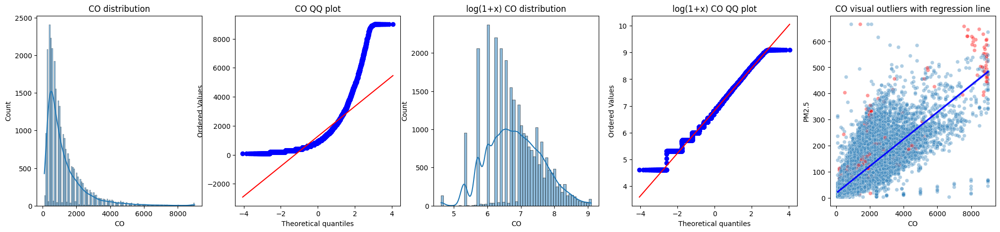

O3


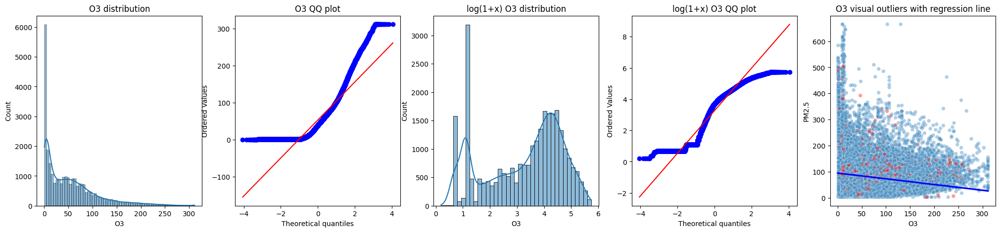

NO2


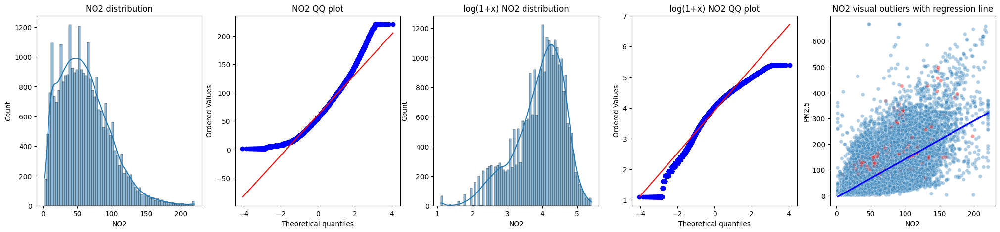

PM2.5


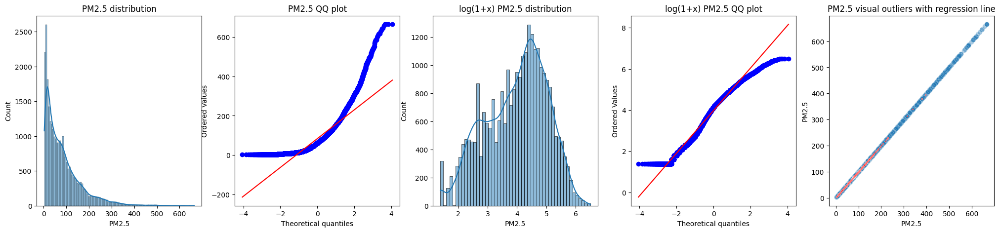

SO2


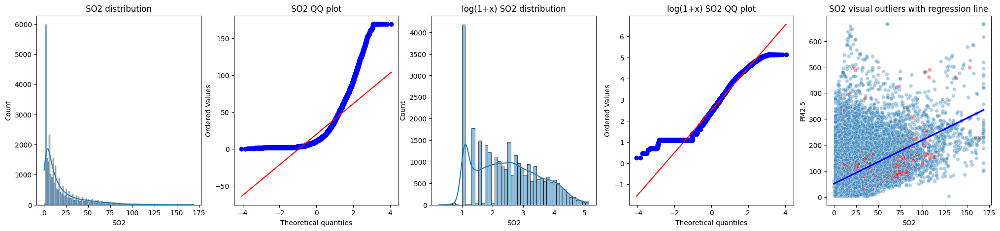

PM10


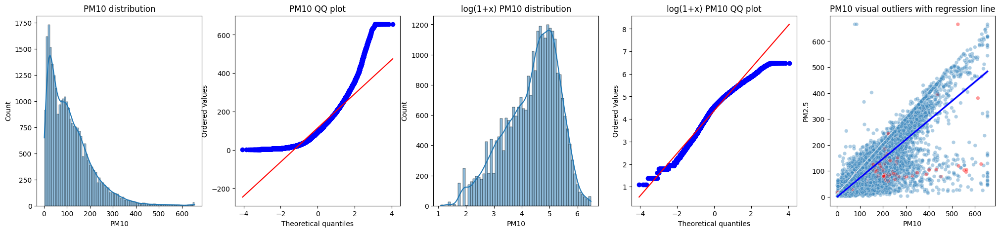

PRES


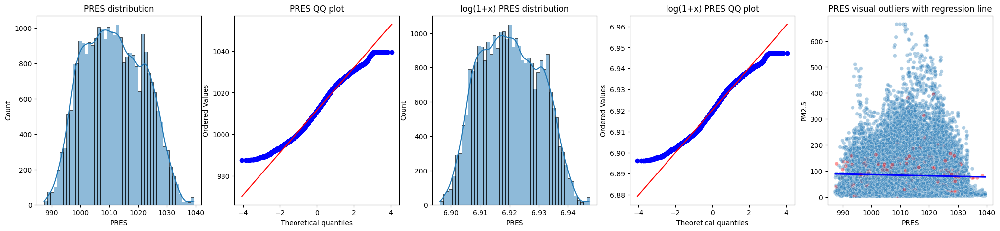

RAIN


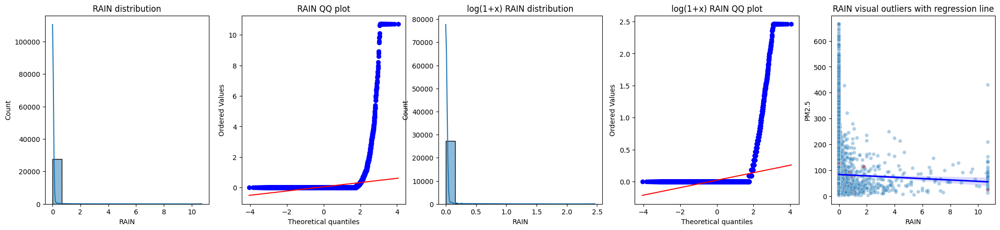

WSPM


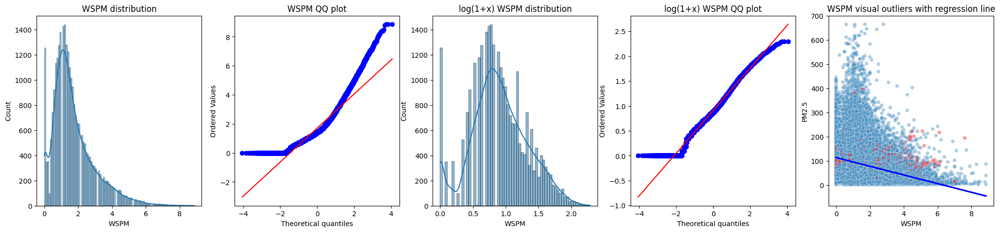

RH


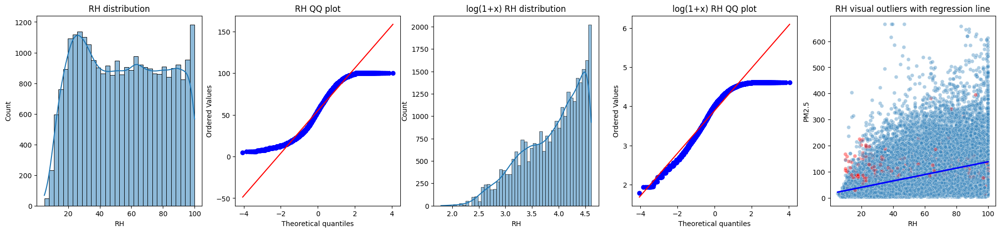

wd_deg


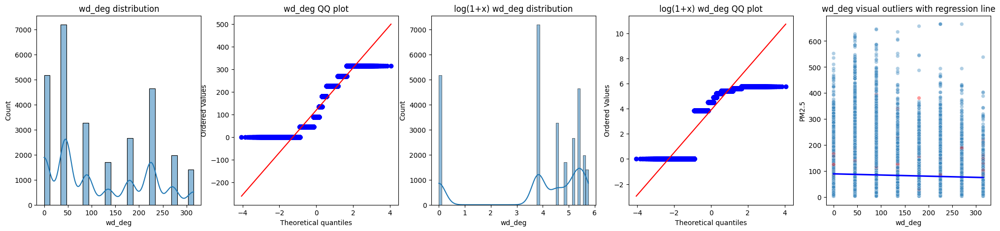

In [82]:
plot_the_features_against_target(dataframe=df_train_imputed, 
                                 features=np.concatenate((numerical_nan_cols,ordinal_nan_cols)), 
                                 target=TARGET, 
                                 imputed_masks=df_train_null_masks)

### Test imputations

CO


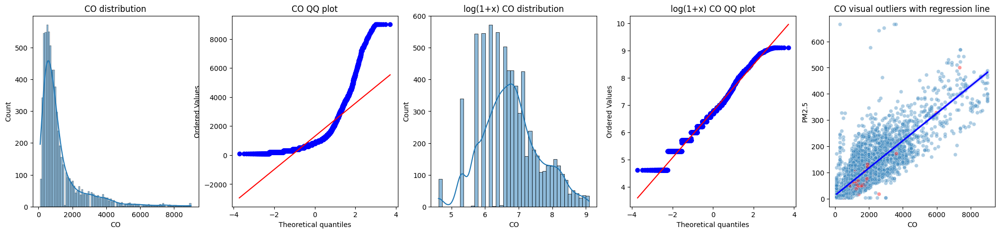

O3


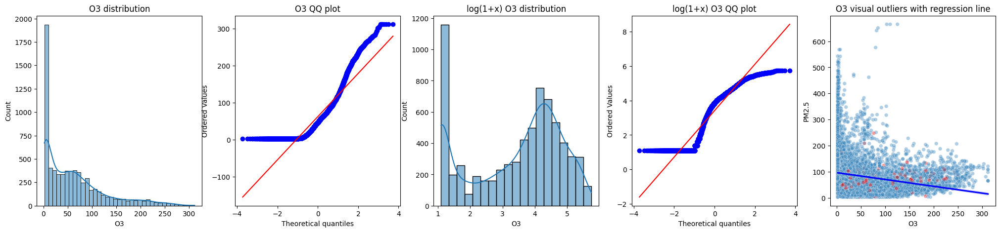

NO2


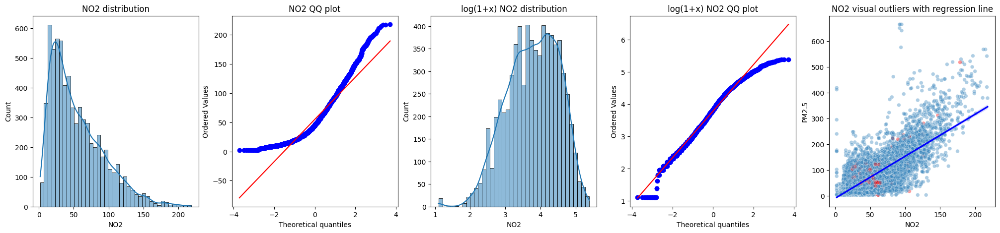

PM2.5


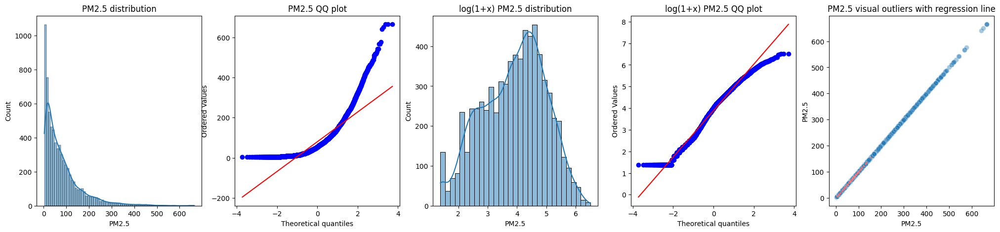

SO2


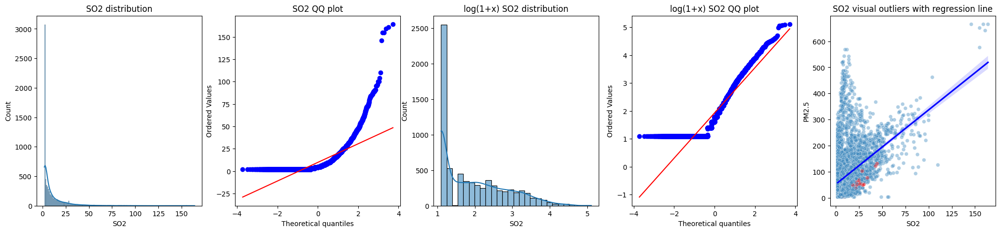

PM10


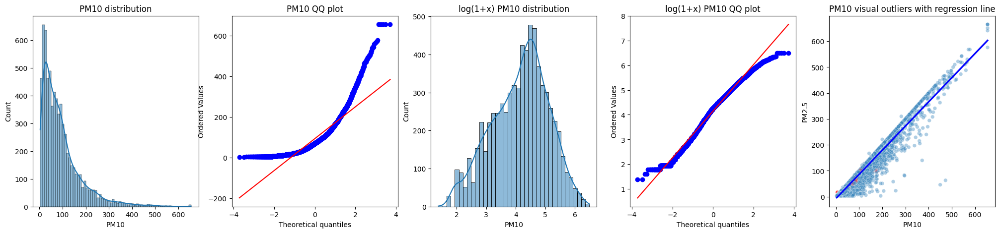

PRES


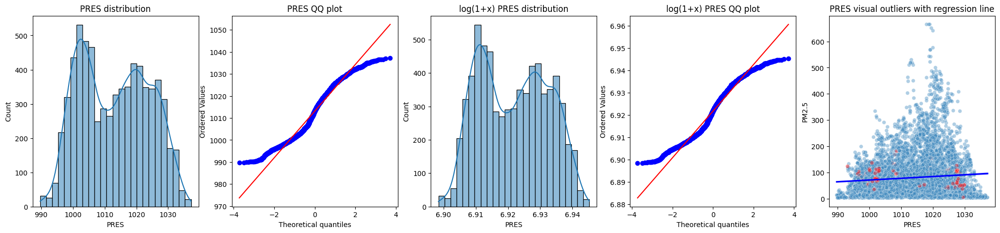

RAIN


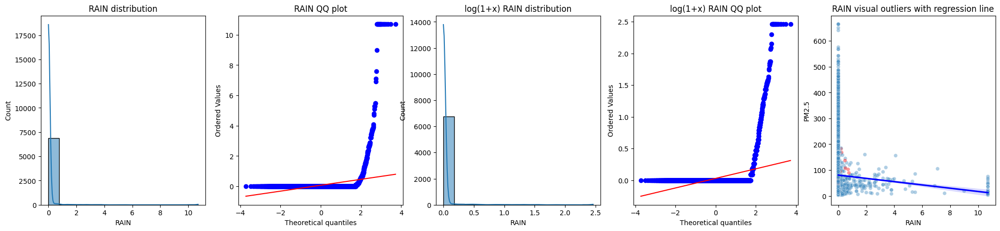

WSPM


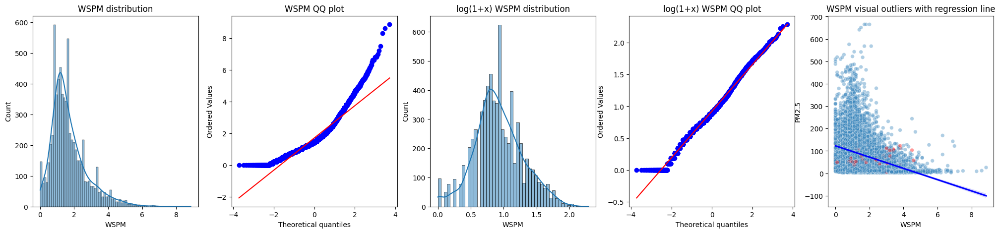

RH


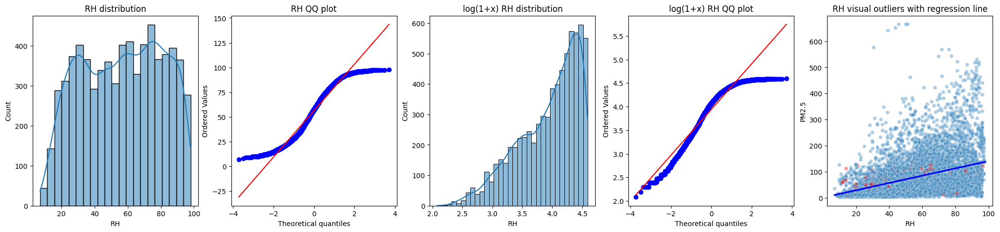

wd_deg


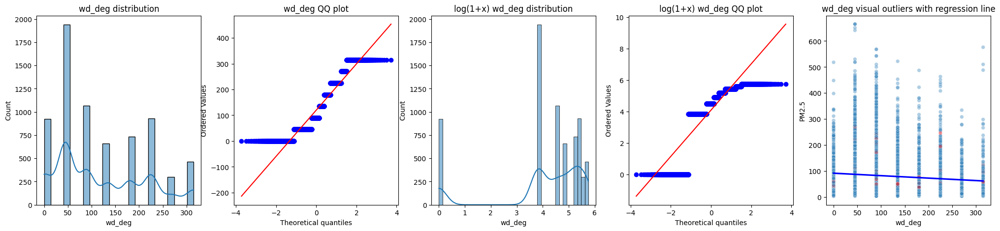

In [83]:
plot_the_features_against_target(dataframe=df_test_imputed, 
                                 features=np.concatenate((numerical_nan_cols,ordinal_nan_cols)), 
                                 target=TARGET, 
                                 imputed_masks=df_test_null_masks)

## Save the data

In [ ]:
# saving numerical imputation model
joblib.dump(rf_num_imputer, os.path.join(data_folder_path, 'models', "numerical_imputer_random_forest.pkl"))

# saving categorical imputation model
joblib.dump(rf_cat_imputer, os.path.join(data_folder_path, 'models', "categorical_imputer_random_forest.pkl"))

In [ ]:
print(f"Train data ({df_train_imputed.shape}:")
display(df_train_imputed.head(3))

print(f"Test data ({df_test_imputed.shape}):")
display(df_test_imputed.head(3))

Train data:


,year,PM10,SO2,NO2,CO,O3,PRES,RAIN,WSPM,hour_sin,...,day_sin,day_cos,dayofweek_sin,dayofweek_cos,wd_deg,season,is_weekend,PM2.5,RH,working_hour_component
datetime,,,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,4.0,4.0,7.0,300.0,77.0,1023.0,0.0,4.4,0.000000,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,4.0,23.878120,0.0
2013-03-01 01:00:00,2013,8.0,4.0,7.0,300.0,77.0,1023.2,0.0,4.7,0.258819,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,8.0,25.880955,0.0
2013-03-01 02:00:00,2013,7.0,5.0,10.0,300.0,73.0,1023.5,0.0,5.6,0.500000,...,0.0,1.0,-0.433884,-0.900969,0.0,2,0,7.0,25.880955,0.0


Test data:


,year,PM10,SO2,NO2,CO,O3,PRES,RAIN,WSPM,hour_sin,...,day_sin,day_cos,dayofweek_sin,dayofweek_cos,wd_deg,season,is_weekend,PM2.5,RH,working_hour_component
datetime,,,,,,,,,,,,,,,,,,,,,
2016-05-12 19:00:00,2016,36.0,2.0,18.0,300.0,89.0,1011.7,0.0,2.2,-0.965926,...,0.743145,-0.669131,0.433884,-0.900969,0.0,2,0,10.0,16.939474,0.0
2016-05-12 20:00:00,2016,52.0,2.0,30.0,400.0,66.0,1012.6,0.0,0.6,-0.866025,...,0.743145,-0.669131,0.433884,-0.900969,0.0,2,0,26.0,31.015002,0.0
2016-05-12 21:00:00,2016,77.0,2.0,47.0,500.0,34.0,1013.8,0.0,0.5,-0.707107,...,0.743145,-0.669131,0.433884,-0.900969,225.0,2,0,11.0,41.051205,0.0


Train shape:


(28051, 22)

Test shape:


(7013, 22)

In [85]:
df_train_imputed.to_csv(os.path.join(data_folder_path, 'processed', "02_df_train_imputed.csv"), index=True, index_label='datetime')
df_test_imputed.to_csv(os.path.join(data_folder_path, 'processed', "02_df_test_imputed.csv"), index=True, index_label='datetime')

In [86]:
gc.collect()

178477

## Summary

Many imputation models have been assessed for different natures of variables. Tree-based iterative imputers have demonstrated quite good reconstruction of missing structure and consistently outperformed the median baseline in Monte-Carlo experiments. A unique classifier-based imputer was developed for categorical variables, and `RandomForest` has outperformed its baselines and other tree-based algorithms.

Visual tests confirmed imputation accuracy, as well as the presumption that the reason of missingness is often associated with extreme/incorrect sensor readings. The integrated pipeline for numericals and categoricals ensures that the dataset is prepared for further analysis by producing dependable imputations that are stable among seeds and statistically better than dummy techniques.